# BATTLE-AMP Manuscript Figures

Unified notebook for all manuscript figures.

**Controls:**
- `SAVE`: `'pdf'`, `'png'`, `'both'`, or `None` to skip
- `FIGURE_DIR`: output directory

**Run from:** `battleamp-snakemake/notebooks/`

In [1]:
"""
Global configuration: paths, colours, fonts, journal constraints.
"""

from pathlib import Path
import os
import sys
import json
import logging
import string
import csv
import numpy as np
import pandas as pd
import warnings

warnings.filterwarnings("ignore")
logging.basicConfig(level=logging.INFO, format="%(levelname)s: %(message)s")
log = logging.getLogger("battleamp")

# Save control: 'pdf', 'png', 'both', or None
SAVE = "both"

# Paths (notebook lives in battleamp-snakemake/notebooks/)
PROJECT_ROOT = Path("..").resolve()
FIGURE_DIR   = PROJECT_ROOT / "figures"
FIGURE_DIR.mkdir(parents=True, exist_ok=True)

DATA_ROOT    = PROJECT_ROOT / "data"
TASKS_DIR    = PROJECT_ROOT / "tasks"
RESULTS_ROOT = PROJECT_ROOT / "results"
CLF_FILE     = RESULTS_ROOT / "aggregated" / "classification_results.tsv"
REG_FILE     = RESULTS_ROOT / "aggregated" / "regression_results.tsv"
INFERENCE_DIR = RESULTS_ROOT / "inference"
MD_DIR       = PROJECT_ROOT / "md"              # MD simulation data
CACHE_DIR    = PROJECT_ROOT / "figure4_cache"  # figure4 compute cache

# Journal constraints
MAX_WIDTH  = 6.5
MAX_HEIGHT = 8.0
DPI        = 600

# Font sizes (all >= 6 pt journal minimum)
FS_TICK    = 6
FS_LABEL   = 7
FS_PANEL   = 10
FS_ANNOT   = 6
FS_TITLE   = 7
FS_LEGEND  = 5.5

# Standardised colour palette
ACTIVE_COLOR   = "#F7CF8B"   # warm yellow  - active peptides only
INACTIVE_COLOR = "#66BDBA"   # teal         - inactive peptides only

# Synthetic negative / dataset-type colours
RANDOM_COLOR    = "#7E7F9A"
SHUFFLED_COLOR  = "#FF6542"
REALISTIC_COLOR = "#721817"

# Dataset colours (fig 4a violins) - clearly distinct from active/inactive
AMP_COLOR = "#8B5E3C"        # dark brown - AMP database membership
GA_COLOR  = "#2B6A99"        # deep blue - GeneralActivity dataset

# ZP displacement colours (fig 5 e/f) - distinct from active/inactive
ZP_NEG_COLOR = "#5B8DB8"     # steel blue - membrane thinning
ZP_POS_COLOR = "#B8725B"     # warm brown - membrane thickening

# Model-type colours
CLF_CLR       = "#d95f6e"
ACT_CLR       = "#9467bd"
REG_CLR       = "#555555"
CLF_CLR_LIGHT = "#f0b3ba"
ACT_CLR_LIGHT = "#c4aad9"
REG_CLR_LIGHT = "#cccccc"

# Dataset palette (fig 4 violins)
DATASET_PAL = {
    "AMP":             AMP_COLOR,
    "GeneralActivity": GA_COLOR,
    "Random":          RANDOM_COLOR,
    "Shuffled":        SHUFFLED_COLOR,
    "Realistic":       REALISTIC_COLOR,
}

# Shared visual constants
BG         = "#F0F0F0"
GRID_CLR   = "#cccccc"
TEXT_CLR   = "#000000"
EXCLUDED_ZONE = "#E0E0E0"

In [2]:
"""
Shared matplotlib style and utility functions.
"""

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from matplotlib.colors import TwoSlopeNorm
import seaborn as sns

matplotlib.rcParams.update({
    "font.family":        "sans-serif",
    "font.sans-serif":    ["Arial", "Helvetica", "Liberation Sans", "DejaVu Sans"],
    "mathtext.default":   "regular",
    "font.size":          FS_LABEL,
    "axes.labelsize":     FS_LABEL,
    "axes.titlesize":     FS_TITLE,
    "xtick.labelsize":    FS_TICK,
    "ytick.labelsize":    FS_TICK,
    "legend.fontsize":    FS_LEGEND,
    "axes.linewidth":     0.4,
    "xtick.major.width":  0.4,
    "ytick.major.width":  0.4,
    "xtick.major.size":   2,
    "ytick.major.size":   2,
    "axes.spines.right":  False,
    "axes.spines.top":    False,
    "figure.facecolor":   "white",
    "axes.facecolor":     BG,
    "axes.grid":          False,
    "text.color":         TEXT_CLR,
    "axes.labelcolor":    TEXT_CLR,
    "xtick.color":        TEXT_CLR,
    "ytick.color":        TEXT_CLR,
    "pdf.fonttype":       42,
    "ps.fonttype":        42,
})


def style_ax(ax):
    """Standard axis styling for all panels."""
    ax.set_facecolor(BG)
    ax.yaxis.grid(True, color=GRID_CLR, linewidth=0.3, zorder=0)
    ax.set_axisbelow(True)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)


def save_figure(fig, stem):
    """Save figure per SAVE setting."""
    if SAVE is None:
        return
    fmt = SAVE.lower() if isinstance(SAVE, str) else None
    kw = dict(bbox_inches="tight", pad_inches=0.02, dpi=DPI, facecolor="white")
    if fmt in ("pdf", "both"):
        p = FIGURE_DIR / f"{stem}.pdf"
        fig.savefig(str(p), **kw)
        print(f"Saved {p}")
    if fmt in ("png", "both"):
        p = FIGURE_DIR / f"{stem}.png"
        fig.savefig(str(p), **kw)
        print(f"Saved {p}")

In [3]:
"""
Unified model nomenclature (nomenclature_reference.md).
"""
from collections import OrderedDict

CLASSIFIERS = [
    "hydramp-amp-classifier", "ampscanner", "amplify",
    "sensexamp-classifier", "ampeppy", "ampredmfa",
]
ACTIVITY_AWARE = ["hydramp-mic-classifier"]
REGRESSORS = [
    "mbc-attention", "ampredictor",
    "sensexamp-ecoli", "sensexamp-saureus",
    "deep-amp-lstm-gramneg", "deep-amp-lstm-grampos",
    "deep-amp-cnn-gramneg", "deep-amp-cnn-grampos",
    "apex-ecoli", "apex-saureus", "apex-min",
    "apex-abaumannii", "apex-paeruginosa", "apex-kpneumoniae",
]
ALL_MODELS = CLASSIFIERS + ACTIVITY_AWARE + REGRESSORS

MODEL_DISPLAY = {
    "hydramp-amp-classifier":  r"HydrAMP$_{\mathrm{AMP}}$",
    "ampscanner":              r"AMPScanner$_{\mathrm{v2}}$",
    "amplify":                 "AMPlify",
    "sensexamp-classifier":    r"SenseXAMP$_{\mathrm{clf}}$",
    "ampeppy":                 "amPEPpy",
    "ampredmfa":               "AMPpred-MFA",
    "hydramp-mic-classifier":  r"HydrAMP$_{\mathrm{Ec}}$",
    "mbc-attention":           "MBC-Attention",
    "ampredictor":             "AMPredictor",
    "sensexamp-ecoli":         r"SenseXAMP$_{\mathrm{Ec}}$",
    "sensexamp-saureus":       r"SenseXAMP$_{\mathrm{Sa}}$",
    "deep-amp-lstm-gramneg":   r"DeepAMP$_{\mathrm{LSTM,\,G-}}$",
    "deep-amp-lstm-grampos":   r"DeepAMP$_{\mathrm{LSTM,\,G+}}$",
    "deep-amp-cnn-gramneg":    r"DeepAMP$_{\mathrm{CNN,\,G-}}$",
    "deep-amp-cnn-grampos":    r"DeepAMP$_{\mathrm{CNN,\,G+}}$",
    "apex-ecoli":              r"APEX$_{\mathrm{Ec}}$",
    "apex-saureus":            r"APEX$_{\mathrm{Sa}}$",
    "apex-min":                r"APEX$_{\mathrm{min}}$",
    "apex-abaumannii":         r"APEX$_{\mathrm{Ab}}$",
    "apex-paeruginosa":        r"APEX$_{\mathrm{Pa}}$",
    "apex-kpneumoniae":        r"APEX$_{\mathrm{Kp}}$",
}

# Ordered dicts for figure 4 (classifiers include HydrAMP_Ec)
CLF_FIG4 = OrderedDict([
    ("hydramp-amp-classifier",  r"HydrAMP$_{\mathrm{AMP}}$"),
    ("ampscanner",              r"AMPScanner$_{\mathrm{v2}}$"),
    ("amplify",                 "AMPlify"),
    ("sensexamp-classifier",    r"SenseXAMP$_{\mathrm{clf}}$"),
    ("ampeppy",                 "amPEPpy"),
    ("ampredmfa",               "AMPpred-MFA"),
    ("hydramp-mic-classifier",  r"HydrAMP$_{\mathrm{Ec}}$"),
])

REG_FIG4 = OrderedDict([
    ("mbc-attention",           "MBC-Attention"),
    ("ampredictor",             "AMPredictor"),
    ("sensexamp-ecoli",         r"SenseXAMP$_{\mathrm{Ec}}$"),
    ("sensexamp-saureus",       r"SenseXAMP$_{\mathrm{Sa}}$"),
    ("deep-amp-lstm-gramneg",   r"DeepAMP$_{\mathrm{LSTM,\,G-}}$"),
    ("deep-amp-lstm-grampos",   r"DeepAMP$_{\mathrm{LSTM,\,G+}}$"),
    ("deep-amp-cnn-gramneg",    r"DeepAMP$_{\mathrm{CNN,\,G-}}$"),
    ("deep-amp-cnn-grampos",    r"DeepAMP$_{\mathrm{CNN,\,G+}}$"),
    ("apex-ecoli",              r"APEX$_{\mathrm{Ec}}$"),
    ("apex-saureus",            r"APEX$_{\mathrm{Sa}}$"),
    ("apex-min",                r"APEX$_{\mathrm{min}}$"),
    ("apex-abaumannii",         r"APEX$_{\mathrm{Ab}}$"),
    ("apex-paeruginosa",        r"APEX$_{\mathrm{Pa}}$"),
    ("apex-kpneumoniae",        r"APEX$_{\mathrm{Kp}}$"),
])

HEATMAP_ORDER = list(CLF_FIG4.keys()) + list(REG_FIG4.keys())

SCATTER_DISPLAY = {
    "mbc-attention":         "MBC-Att.",
    "ampredictor":           "AMPred.",
    "sensexamp-ecoli":       r"SX$_{\rm Ec}$",
    "sensexamp-saureus":     r"SX$_{\rm Sa}$",
    "deep-amp-lstm-gramneg": r"DA$_{\rm L,G-}$",
    "deep-amp-lstm-grampos": r"DA$_{\rm L,G+}$",
    "deep-amp-cnn-gramneg":  r"DA$_{\rm C,G-}$",
    "deep-amp-cnn-grampos":  r"DA$_{\rm C,G+}$",
    "apex-ecoli":            r"AP$_{\rm Ec}$",
    "apex-saureus":          r"AP$_{\rm Sa}$",
    "apex-min":              r"AP$_{\rm min}$",
    "apex-abaumannii":       r"AP$_{\rm Ab}$",
    "apex-paeruginosa":      r"AP$_{\rm Pa}$",
    "apex-kpneumoniae":      r"AP$_{\rm Kp}$",
}

ML_MODELS_FIG5 = [
    ("sensexamp-ecoli",   "sensexamp-ecoli_MIC",   "sensexamp-ecoli",     r"SenseXAMP$_{\mathrm{Ec}}$"),
    ("mbc-attention",     "mbc-attention_MIC",      "mbc-attention",       "MBC-Att."),
    ("sensexamp-saureus", "sensexamp-saureus_MIC",  "sensexamp-saureus",   r"SenseXAMP$_{\mathrm{Sa}}$"),
    ("ampredictor",       "ampredictor_MIC",        "ampredictor",         "AMPredictor"),
    ("apex-min",          "apex-min_MIC",           "apex-min",            r"APEX$_{\mathrm{min}}$"),
    ("deep-amp-gram+",    "deep-amp-gram+_MIC",     "deep-amp-lstm-grampos", r"DeepAMP$_{\mathrm{G+}}$"),
    ("deep-amp-gram-",    "deep-amp-gram-_MIC",     "deep-amp-lstm-gramneg", r"DeepAMP$_{\mathrm{G-}}$"),
]


def short_name(m):
    return MODEL_DISPLAY.get(m, m)

def scatter_name(m):
    return SCATTER_DISPLAY.get(m, short_name(m))

def model_type(m):
    if m in CLASSIFIERS:    return "clf"
    if m in ACTIVITY_AWARE: return "act"
    return "reg"

def model_color(m):
    return {"clf": CLF_CLR, "act": ACT_CLR}.get(model_type(m), REG_CLR)

def type_bar_dark(t):
    return {"clf": CLF_CLR, "act": ACT_CLR}.get(t, "#999999")

def type_bar_light(t):
    return {"clf": CLF_CLR_LIGHT, "act": ACT_CLR_LIGHT}.get(t, REG_CLR_LIGHT)

## Figure 2: Activity-based evaluation

**Alt text:** Four-panel figure comparing AMP prediction models on
activity-based benchmarking. (a) MCC, (b) FPR on GeneralActivity
vs AMP/non-AMP, (c) Precision@100, (d) LR+ on GeneralActivity and SLAY.

INFO: maxp pruned
INFO: cmap pruned
INFO: kern dropped
INFO: post pruned
INFO: FFTM dropped
INFO: GPOS pruned
INFO: GSUB pruned
INFO: glyf pruned
INFO: Added gid0 to subset
INFO: Added first four glyphs to subset
INFO: Closing glyph list over 'MATH': 27 glyphs before
INFO: Glyph names: ['.notdef', '.null', 'A', 'C', 'E', 'G', 'K', 'L', 'M', 'P', 'S', 'a', 'b', 'c', 'comma', 'f', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'p', 'plus', 'space', 'two', 'v']
INFO: Glyph IDs:   [0, 1, 2, 3, 14, 15, 21, 36, 38, 40, 42, 46, 47, 48, 51, 54, 68, 69, 70, 73, 76, 79, 80, 81, 83, 89, 3228]
INFO: Closed glyph list over 'MATH': 27 glyphs after
INFO: Glyph names: ['.notdef', '.null', 'A', 'C', 'E', 'G', 'K', 'L', 'M', 'P', 'S', 'a', 'b', 'c', 'comma', 'f', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'p', 'plus', 'space', 'two', 'v']
INFO: Glyph IDs:   [0, 1, 2, 3, 14, 15, 21, 36, 38, 40, 42, 46, 47, 48, 51, 54, 68, 69, 70, 73, 76, 79, 80, 81, 83, 89, 3228]
INFO: Closing glyph list over 'GS

Saved /home/pszymczak/code/battleamp-snakemake/figures/figure2.pdf
Saved /home/pszymczak/code/battleamp-snakemake/figures/figure2.png


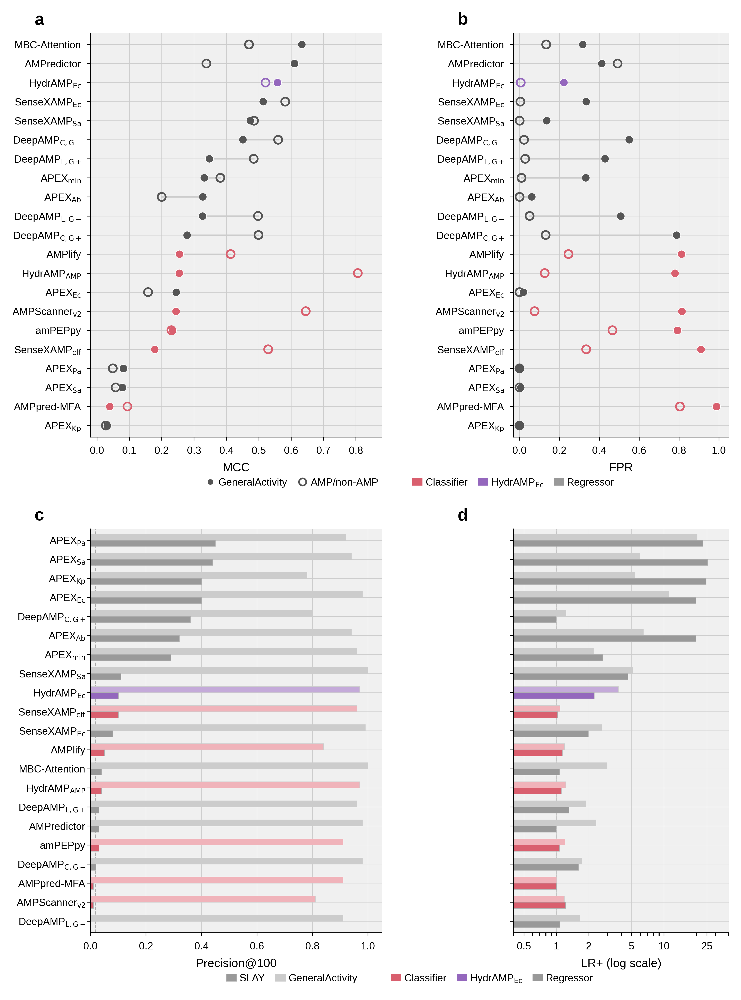

In [4]:
# Figure 2: Activity-based evaluation

df2 = pd.read_csv(CLF_FILE, sep="\t")
df2 = df2[df2["variant"] != "example-model"].copy()

amp     = df2[df2["task"] == "amp"].set_index("variant")
ga      = df2[df2["task"] == "broad_activity"].set_index("variant")
slay_df = df2[df2["task"] == "slay"].set_index("variant")

ga_models = [m for m in ALL_MODELS if m in ga.index]
N2 = len(ga_models)

def _safe(fr, m, col, d=np.nan):
    return fr.loc[m, col] if m in fr.index else d

def _lr(fr, m):
    tpr = _safe(fr, m, "tpr", 0); fpr = _safe(fr, m, "fpr", 0)
    return tpr / fpr if fpr > 0 else 0.0

types2 = [model_type(m) for m in ga_models]
names2 = [short_name(m) for m in ga_models]
amp_mcc  = np.array([_safe(amp, m, "mcc", 0) for m in ga_models])
amp_fpr  = np.array([_safe(amp, m, "fpr", 0) for m in ga_models])
ga_mcc   = np.array([_safe(ga,  m, "mcc", 0) for m in ga_models])
ga_fpr   = np.array([_safe(ga,  m, "fpr", 0) for m in ga_models])
ga_p100  = np.array([_safe(ga,  m, "precision_at_k", 0) for m in ga_models])
ga_lr    = np.array([_lr(ga, m) for m in ga_models])
slay_p100 = np.array([_safe(slay_df, m, "precision_at_k", 0) for m in ga_models])
slay_lr  = np.array([_lr(slay_df, m) for m in ga_models])
slay_base = slay_df.iloc[0]["n_positive"] / (slay_df.iloc[0]["n_positive"] + slay_df.iloc[0]["n_negative"])

colors2 = [model_color(m) for m in ga_models]

# Compact names for fig2 (avoid tall math subscripts causing overlap)
COMPACT_DISPLAY = {
    "hydramp-amp-classifier":  r"HydrAMP$_{\rm AMP}$",
    "ampscanner":              r"AMPScanner$_{\rm v2}$",
    "amplify":                 "AMPlify",
    "sensexamp-classifier":    r"SenseXAMP$_{\rm clf}$",
    "ampeppy":                 "amPEPpy",
    "ampredmfa":               "AMPpred-MFA",
    "hydramp-mic-classifier":  r"HydrAMP$_{\rm Ec}$",
    "mbc-attention":           "MBC-Attention",
    "ampredictor":             "AMPredictor",
    "sensexamp-ecoli":         r"SenseXAMP$_{\rm Ec}$",
    "sensexamp-saureus":       r"SenseXAMP$_{\rm Sa}$",
    "deep-amp-lstm-gramneg":   r"DeepAMP$_{\rm L,G-}$",
    "deep-amp-lstm-grampos":   r"DeepAMP$_{\rm L,G+}$",
    "deep-amp-cnn-gramneg":    r"DeepAMP$_{\rm C,G-}$",
    "deep-amp-cnn-grampos":    r"DeepAMP$_{\rm C,G+}$",
    "apex-ecoli":              r"APEX$_{\rm Ec}$",
    "apex-saureus":            r"APEX$_{\rm Sa}$",
    "apex-min":                r"APEX$_{\rm min}$",
    "apex-abaumannii":         r"APEX$_{\rm Ab}$",
    "apex-paeruginosa":        r"APEX$_{\rm Pa}$",
    "apex-kpneumoniae":        r"APEX$_{\rm Kp}$",
}
names2c = [COMPACT_DISPLAY.get(m, m) for m in ga_models]

def _ylabels2(ax, order):
    ax.set_yticks(np.arange(len(order)))
    ax.set_yticklabels([names2c[i] for i in order], fontsize=FS_TICK)
    ax.set_ylim(-0.6, len(order) - 0.4)

def dumbbell(ax, vf, vo, order, xlabel, xlim=None):
    for rank, i in enumerate(order):
        c = colors2[i]
        ax.plot([vf[i], vo[i]], [rank, rank], color=GRID_CLR, lw=0.8, zorder=1)
        ax.scatter(vf[i], rank, c=c, s=22, zorder=3, edgecolor="white", lw=0.3)
        ax.scatter(vo[i], rank, facecolors="none", edgecolors=c, s=22, lw=1.0, zorder=3)
    _ylabels2(ax, order)
    ax.set_xlabel(xlabel, fontsize=FS_LABEL)
    if xlim: ax.set_xlim(xlim)
    style_ax(ax)
    ax.xaxis.grid(True, color=GRID_CLR, linewidth=0.3)

def grouped_barh(ax, vd, vl, order, xlabel, xlim=None, log=False, ref=None):
    h = 0.32
    for rank, i in enumerate(order):
        t = types2[i]
        ax.barh(rank + h/2, vl[i], height=h, color=type_bar_light(t), edgecolor=GRID_CLR, lw=0.3)
        ax.barh(rank - h/2, vd[i], height=h, color=type_bar_dark(t), edgecolor="#aaa", lw=0.3)
    _ylabels2(ax, order)
    ax.tick_params(axis="y", pad=1)
    ax.set_xlabel(xlabel, fontsize=FS_LABEL)
    if log: ax.set_xscale("log")
    if xlim: ax.set_xlim(xlim)
    if ref is not None: ax.axvline(ref, color="#aaa", lw=0.5, ls="--", zorder=0)
    style_ax(ax)
    ax.xaxis.grid(True, color=GRID_CLR, linewidth=0.3)

order_ab = sorted(range(N2), key=lambda i: ga_mcc[i])
order_cd = sorted(range(N2), key=lambda i: slay_p100[i])

fig2 = plt.figure(figsize=(MAX_WIDTH, MAX_HEIGHT), dpi=DPI, facecolor="white")
gs2 = gridspec.GridSpec(4, 2, height_ratios=[1, 0.04, 1, 0.04],
    width_ratios=[1.15, 0.85], hspace=0.18, wspace=0.52,
    left=0.17, right=0.97, top=0.98, bottom=0.01)

ax_a = fig2.add_subplot(gs2[0, 0]); ax_b = fig2.add_subplot(gs2[0, 1])
ax_lg1 = fig2.add_subplot(gs2[1, :]); ax_lg1.axis("off")
ax_c = fig2.add_subplot(gs2[2, 0]); ax_d = fig2.add_subplot(gs2[2, 1])
ax_lg2 = fig2.add_subplot(gs2[3, :]); ax_lg2.axis("off")

dumbbell(ax_a, ga_mcc, amp_mcc, order_ab, "MCC", (-0.02, 0.88))
dumbbell(ax_b, ga_fpr, amp_fpr, order_ab, "FPR", (-0.03, 1.05))
grouped_barh(ax_c, slay_p100, ga_p100, order_cd, "Precision@100", (0, 1.05), ref=slay_base)

sl = np.where(slay_lr > 0, slay_lr, 0.5); gl = np.where(ga_lr > 0, ga_lr, 0.5)
grouped_barh(ax_d, sl, gl, order_cd, "LR+ (log scale)", (0.4, 40), log=True, ref=1.0)
ax_d.set_xticks([0.5, 1, 2, 5, 10, 25])
ax_d.set_xticklabels(["0.5", "1", "2", "5", "10", "25"], fontsize=FS_TICK)
ax_d.xaxis.set_minor_formatter(mticker.NullFormatter())
ax_d.set_yticklabels([])

# Legends
leg_ab = [
    Line2D([0],[0], marker="o", color="w", mfc="#555", ms=4.2, label="GeneralActivity"),
    Line2D([0],[0], marker="o", color="w", mfc="none", mec="#555", ms=4.2, mew=1, label="AMP/non-AMP"),
    Patch(fc="none", ec="none", label=""),
    Patch(fc=CLF_CLR, ec="none", label="Classifier"),
    Patch(fc=ACT_CLR, ec="none", label=r"HydrAMP$_{\mathrm{Ec}}$"),
    Patch(fc="#999", ec="none", label="Regressor"),
]
ax_lg1.legend(handles=leg_ab, fontsize=FS_TICK, loc="center", ncol=6, frameon=False,
              handletextpad=0.3, columnspacing=1.0, handlelength=1, handleheight=0.7)
leg_cd = [
    Patch(fc="#999", ec="#aaa", lw=0.3, label="SLAY"),
    Patch(fc=REG_CLR_LIGHT, ec=GRID_CLR, lw=0.3, label="GeneralActivity"),
    Patch(fc="none", ec="none", label=""),
    Patch(fc=CLF_CLR, ec="none", label="Classifier"),
    Patch(fc=ACT_CLR, ec="none", label=r"HydrAMP$_{\mathrm{Ec}}$"),
    Patch(fc="#999", ec="none", label="Regressor"),
]
ax_lg2.legend(handles=leg_cd, fontsize=FS_TICK, loc="center", ncol=6, frameon=False,
              handletextpad=0.3, columnspacing=1.0, handlelength=1, handleheight=0.7)

for lbl, ax in [("a", ax_a), ("b", ax_b), ("c", ax_c), ("d", ax_d)]:
    p = ax.get_position()
    fig2.text(p.x0 - 0.07, p.y1 + 0.005, lbl, fontsize=FS_PANEL, fontweight="bold", va="bottom", ha="left")

save_figure(fig2, "figure2")
plt.show()

## Figure 3: Biological hierarchy evaluation

**Alt text:** Three-panel figure. (a) MCC heatmap across 15 classification
tasks. (b) Regression performance heatmap. (c) Scatter plots of regression
metrics for E. coli and S. aureus.

INFO: maxp pruned
INFO: cmap pruned
INFO: kern dropped
INFO: post pruned
INFO: FFTM dropped
INFO: GPOS pruned
INFO: GSUB pruned
INFO: glyf pruned
INFO: Added gid0 to subset
INFO: Added first four glyphs to subset
INFO: Closing glyph list over 'MATH': 31 glyphs before
INFO: Glyph names: ['.notdef', '.null', 'A', 'C', 'E', 'G', 'K', 'L', 'M', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'comma', 'f', 'g', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'p', 'plus', 'space', 'two', 'v']
INFO: Glyph IDs:   [0, 1, 2, 3, 14, 15, 21, 36, 38, 40, 42, 46, 47, 48, 49, 51, 54, 55, 68, 69, 70, 73, 74, 76, 79, 80, 81, 82, 83, 89, 3228]
INFO: Closed glyph list over 'MATH': 31 glyphs after
INFO: Glyph names: ['.notdef', '.null', 'A', 'C', 'E', 'G', 'K', 'L', 'M', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'comma', 'f', 'g', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'p', 'plus', 'space', 'two', 'v']
INFO: Glyph IDs:   [0, 1, 2, 3, 14, 15, 21, 36, 38, 40, 42, 46, 47, 48, 49, 51, 54, 55, 68, 69, 70, 73,

Saved /home/pszymczak/code/battleamp-snakemake/figures/figure3.pdf
Saved /home/pszymczak/code/battleamp-snakemake/figures/figure3.png


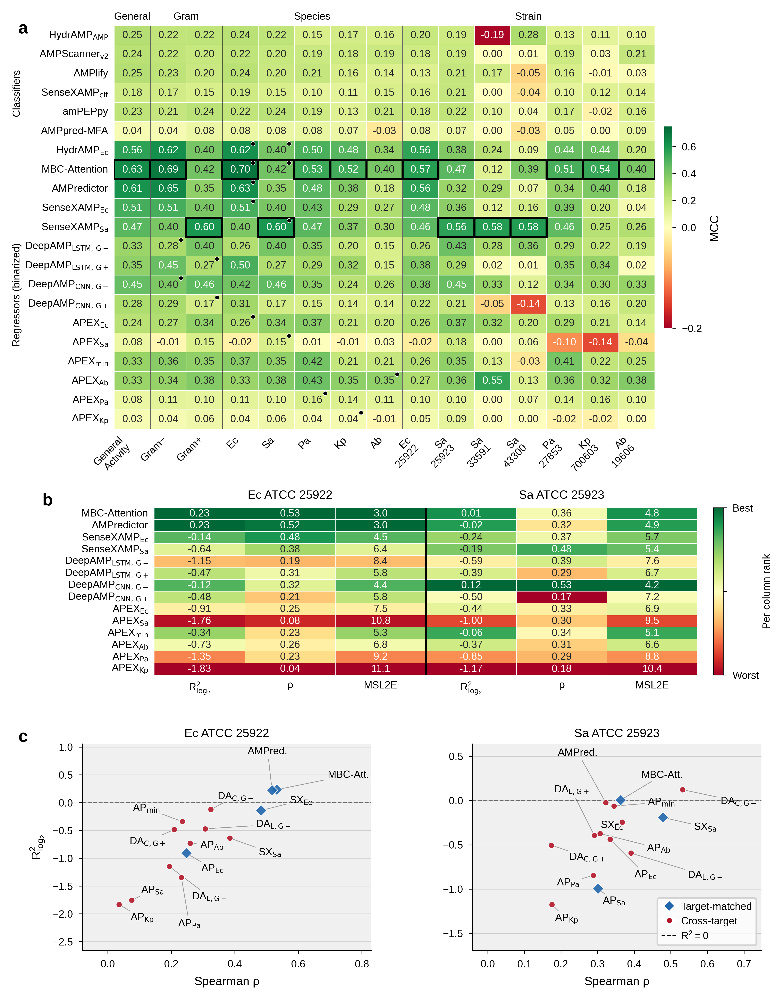

In [13]:
# Figure 3: Biological hierarchy evaluation

try:
    from adjustText import adjust_text
    HAS_ADJUST = True
except ImportError:
    HAS_ADJUST = False

CLF_TASKS = [
    "broad_activity", "gram_minus", "gram_plus",
    "species_ecoli", "species_saureus", "species_paeruginosa",
    "species_kpneumoniae", "species_abaumannii",
    "strain_ecoli25922", "strain_saureus25923", "strain_saureus33591",
    "strain_saureus43300", "strain_paeruginosa27853",
    "strain_kpneumoniae700603", "strain_abaumannii19606",
]
CLF_TASK_SHORT = [
    "General\nActivity", "Gram$-$", "Gram$+$",
    "Ec", "Sa", "Pa", "Kp", "Ab",
    "Ec\n25922", "Sa\n25923", "Sa\n33591", "Sa\n43300",
    "Pa\n27853", "Kp\n700603", "Ab\n19606",
]
TASK_GROUPS = [("General", 0, 1), ("Gram", 1, 3), ("Species", 3, 8), ("Strain", 8, 15)]
N_CLF = len(CLASSIFIERS); N_ACT = len(ACTIVITY_AWARE)
MODEL_GROUPS = [("Classifiers", 0, N_CLF + N_ACT),
                ("Regressors (binarized)", N_CLF + N_ACT, len(ALL_MODELS))]
TRAINING_TARGET = {
    "sensexamp-ecoli": [3], "sensexamp-saureus": [4],
    "deep-amp-lstm-gramneg": [1], "deep-amp-lstm-grampos": [2],
    "deep-amp-cnn-gramneg": [1], "deep-amp-cnn-grampos": [2],
    "apex-ecoli": [3], "apex-saureus": [4], "apex-abaumannii": [7],
    "apex-paeruginosa": [5], "apex-kpneumoniae": [6],
    "mbc-attention": [3, 4], "ampredictor": [3], "hydramp-mic-classifier": [3, 4],
}

REG_TASKS = ["regression_ecoli25922", "regression_saureus25923"]
REG_TASK_LABELS = ["Ec ATCC 25922", "Sa ATCC 25923"]
REG_METRICS = ["r2_log2", "spearman", "msl2e"]
REG_METRIC_LABELS = [r"$R^2_{\log_2}$", r"$\rho$", "MSL2E"]
HIGHER_BETTER = [True, True, False]

df_clf = pd.read_csv(CLF_FILE, sep="\t"); df_clf = df_clf[df_clf["variant"] != "example-model"].copy()
df_reg = pd.read_csv(REG_FILE, sep="\t"); df_reg = df_reg[df_reg["variant"] != "example-model"].copy()
df_all = pd.concat([df_clf, df_reg], ignore_index=True)

def build_matrix(models, tasks, metric, data=None):
    if data is None: data = df_all
    mat = np.full((len(models), len(tasks)), np.nan)
    for i, m in enumerate(models):
        for j, t in enumerate(tasks):
            row = data[(data["variant"] == m) & (data["task"] == t)]
            if not row.empty:
                val = row.iloc[0][metric]
                if pd.notna(val) and val != "":
                    try: mat[i, j] = float(val)
                    except (ValueError, TypeError): pass
    return mat

clf_mcc = build_matrix(ALL_MODELS, CLF_TASKS, "mcc")
clf_cov = build_matrix(ALL_MODELS, CLF_TASKS, "coverage")

# Layout
fig3 = plt.figure(figsize=(MAX_WIDTH, MAX_HEIGHT), dpi=DPI, facecolor="white")
gs_a3 = gridspec.GridSpec(1, 1, left=0.14, right=0.95, top=0.97, bottom=0.56)
gs_b3 = gridspec.GridSpec(1, 1, left=0.19, right=0.87, top=0.48, bottom=0.31)
gs_c3 = gridspec.GridSpec(1, 2, left=0.10, right=0.95, top=0.24, bottom=0.03, wspace=0.35)
n_tasks = len(CLF_TASKS); n_models = len(ALL_MODELS)

# Panel A
ax3a = fig3.add_subplot(gs_a3[0, 0])
mask_a = np.isnan(clf_mcc) | ((~np.isnan(clf_cov)) & (clf_cov < 0.5))
norm_a = TwoSlopeNorm(vmin=-0.2, vcenter=0, vmax=0.75)
sns.heatmap(clf_mcc, mask=mask_a, ax=ax3a, cmap="RdYlGn", norm=norm_a,
    linewidths=0.2, linecolor="white", annot=True, fmt=".2f",
    annot_kws={"size": FS_ANNOT},
    cbar_kws={"shrink": 0.50, "aspect": 25, "pad": 0.015},
    xticklabels=CLF_TASK_SHORT, yticklabels=[short_name(m) for m in ALL_MODELS])

for i in range(n_models):
    for j in range(n_tasks):
        if mask_a[i, j]:
            ax3a.add_patch(mpatches.Rectangle((j, i), 1, 1, fc="#f0f0f0", ec="white", lw=0.2))
for mk, ti in TRAINING_TARGET.items():
    if mk in ALL_MODELS:
        mi = ALL_MODELS.index(mk)
        for j in ti:
            if not mask_a[mi, j]:
                ax3a.plot(j + 0.85, mi + 0.15, "o", ms=2.5, color="black", mec="white", mew=0.3, zorder=5)
for j in range(n_tasks):
    cv = clf_mcc[:, j].copy(); cv[mask_a[:, j]] = np.nan
    if not np.all(np.isnan(cv)):
        bi = np.nanargmax(cv)
        ax3a.add_patch(mpatches.Rectangle((j, bi), 1, 1, fc="none", ec="black", lw=1.2, zorder=4))

ax3a.set_xticklabels(ax3a.get_xticklabels(), rotation=45, ha="right", fontsize=FS_TICK)
ax3a.xaxis.set_ticks_position("bottom")
for lbl in ax3a.get_yticklabels(): lbl.set_fontsize(FS_TICK); lbl.set_color("black")
ax3a.tick_params(axis="both", length=0)
cbar_a = ax3a.collections[0].colorbar
cbar_a.ax.tick_params(labelsize=FS_TICK); cbar_a.set_label("MCC", fontsize=FS_LABEL)
for _, s, e in MODEL_GROUPS:
    if s > 0: ax3a.axhline(y=s, color="black", lw=1)
for _, _, e in TASK_GROUPS[:-1]: ax3a.axvline(x=e, color="black", lw=0.5, alpha=0.6)
for lb, s, e in TASK_GROUPS:
    ax3a.text((s+e)/2/n_tasks, 1.01, lb, ha="center", va="bottom", fontsize=FS_TICK, transform=ax3a.transAxes)
for lb, s, e in MODEL_GROUPS:
    ax3a.text(-0.18, 1-(s+e)/2/n_models, lb.replace("\n"," "), ha="center", va="center",
              fontsize=FS_TICK, rotation=90, transform=ax3a.transAxes, clip_on=False)

# Panel B
ax3b = fig3.add_subplot(gs_b3[0, 0])
n_orgs = len(REG_TASKS); n_mets = len(REG_METRICS)
reg_raw = np.full((len(REGRESSORS), n_orgs * n_mets), np.nan)
for i, m in enumerate(REGRESSORS):
    for j, t in enumerate(REG_TASKS):
        for k, met in enumerate(REG_METRICS):
            row = df_reg[(df_reg["variant"] == m) & (df_reg["task"] == t)]
            if not row.empty:
                val = row.iloc[0][met]
                if pd.notna(val) and val != "":
                    try: reg_raw[i, j*n_mets+k] = float(val)
                    except: pass

reg_norm = reg_raw.copy()
for ci in range(reg_raw.shape[1]):
    mi2 = ci % n_mets; col = reg_raw[:, ci]; v = col[~np.isnan(col)]
    if len(v) > 0 and v.max() > v.min():
        reg_norm[:, ci] = (col - v.min()) / (v.max() - v.min())
        if not HIGHER_BETTER[mi2]: reg_norm[:, ci] = 1 - reg_norm[:, ci]
    elif len(v) > 0: reg_norm[:, ci] = 0.5

at = np.full(reg_raw.shape, "", dtype=object)
for i in range(reg_raw.shape[0]):
    for j in range(reg_raw.shape[1]):
        if not np.isnan(reg_raw[i,j]):
            at[i,j] = f"{reg_raw[i,j]:.1f}" if j%n_mets==2 else f"{reg_raw[i,j]:.2f}"

mask_b = np.isnan(reg_raw)
cl = [ml for _ in REG_TASK_LABELS for ml in REG_METRIC_LABELS]
sns.heatmap(reg_norm, mask=mask_b, ax=ax3b, cmap="RdYlGn", vmin=0, vmax=1,
    linewidths=0.2, linecolor="white", annot=at, fmt="", annot_kws={"size": FS_ANNOT},
    cbar=False, xticklabels=cl, yticklabels=[short_name(m) for m in REGRESSORS])
ax3b.set_xticklabels(ax3b.get_xticklabels(), rotation=0, ha="center", fontsize=FS_TICK)
for lbl in ax3b.get_yticklabels(): lbl.set_fontsize(FS_TICK); lbl.set_color("black")
ax3b.tick_params(axis="both", length=0)
for i in range(len(REGRESSORS)):
    for j in range(n_orgs*n_mets):
        if mask_b[i,j]: ax3b.add_patch(mpatches.Rectangle((j,i),1,1,fc="#f0f0f0",ec="white",lw=0.2))
ax3b.axvline(x=n_mets, color="black", lw=1)
for idx, ol in enumerate(REG_TASK_LABELS):
    ax3b.text((idx*n_mets+n_mets/2)/(n_mets*n_orgs), 1.04, ol, ha="center", va="bottom",
              fontsize=FS_LABEL, transform=ax3b.transAxes)
bp = ax3b.get_position()
cax_b = fig3.add_axes([bp.x1+0.02, bp.y0, 0.012, bp.height])
sm = plt.cm.ScalarMappable(cmap="RdYlGn", norm=plt.Normalize(0,1)); sm.set_array([])
cb = fig3.colorbar(sm, cax=cax_b); cb.set_ticks([0,0.5,1])
cax_b.set_yticklabels(["Worst","","Best"]); cax_b.tick_params(labelsize=FS_TICK, size=2)
cb.set_label("Per-column rank", fontsize=FS_TICK, labelpad=2)

# Panel C
rd = []
for m in REGRESSORS:
    for ti, t in enumerate(REG_TASKS):
        row = df_reg[(df_reg["variant"]==m)&(df_reg["task"]==t)]
        if not row.empty:
            r2 = row.iloc[0].get("r2_log2", np.nan); rho = row.iloc[0].get("spearman", np.nan)
            if pd.notna(r2) and pd.notna(rho):
                rd.append({"model":m,"task":t,"task_idx":ti,"r2":float(r2),"rho":float(rho)})
rsd = pd.DataFrame(rd)
EC_TR = {"mbc-attention","ampredictor","sensexamp-ecoli","apex-ecoli"}
SA_TR = {"mbc-attention","sensexamp-saureus","apex-saureus"}

axc = []
for ti, (tk, tl) in enumerate(zip(REG_TASKS, REG_TASK_LABELS)):
    ax = fig3.add_subplot(gs_c3[0, ti]); axc.append(ax)
    ax.set_facecolor(BG)
    sub = rsd[rsd["task"]==tk]; ts = EC_TR if ti==0 else SA_TR
    texts=[]; xc=[]; yc=[]
    for _, r in sub.iterrows():
        tr = r["model"] in ts; mk = "D" if tr else "o"; ms = 4.5 if tr else 3.5
        c = "#2166ac" if tr else "#b2182b"
        ax.plot(r["rho"], r["r2"], marker=mk, ms=ms, color=c, mec="white", mew=0.4, alpha=0.9, zorder=3)
        xc.append(r["rho"]); yc.append(r["r2"])
        texts.append(ax.text(r["rho"], r["r2"], scatter_name(r["model"]), fontsize=FS_TICK, ha="left", va="center", zorder=4))
    ax.axhline(y=0, color="black", lw=0.6, ls="--", alpha=0.5)
    rr = sub["rho"].values; r2r = sub["r2"].values
    ax.set_xlim(max(-0.08, rr.min()-max((rr.max()-rr.min())*0.6, 0.12)),
                min(1.10, rr.max()+max((rr.max()-rr.min())*0.6, 0.12)))
    ax.set_ylim(r2r.min()-max((r2r.max()-r2r.min())*0.4, 0.20),
                r2r.max()+max((r2r.max()-r2r.min())*0.4, 0.20))
    if HAS_ADJUST:
        adjust_text(texts, x=xc, y=yc, ax=ax, arrowprops=dict(arrowstyle="-", color="#999", lw=0.4),
            force_text=(1.2,1.2), force_static=(0.8,0.8), force_pull=(0.01,0.01),
            force_explode=(0.6,0.6), expand=(2.0,2.5), max_move=(10,10),
            iter_lim=5000, time_lim=30,
            ensure_inside_axes=True, prevent_crossings=True)
    ax.set_xlabel(r"Spearman $\rho$", fontsize=FS_LABEL)
    if ti==0: ax.set_ylabel(r"$R^2_{\log_2}$", fontsize=FS_LABEL)
    ax.set_title(tl, fontsize=FS_LABEL, pad=4)
    style_ax(ax)

axc[1].legend(handles=[
    Line2D([0],[0],marker="D",color="w",mfc="#2166ac",mec="white",ms=5,label="Target-matched"),
    Line2D([0],[0],marker="o",color="w",mfc="#b2182b",mec="white",ms=4,label="Cross-target"),
    Line2D([0],[0],color="black",lw=0.6,ls="--",label="$R^2 = 0$"),
], loc="lower right", fontsize=FS_TICK, frameon=True, facecolor="white", edgecolor="#ccc",
   handlelength=1.5, handletextpad=0.4)

fig3.text(0.02, 0.975, "a", fontsize=FS_PANEL, fontweight="bold", va="top")
fig3.text(0.05, 0.495, "b", fontsize=FS_PANEL, fontweight="bold", va="top")
fig3.text(0.02, 0.255, "c", fontsize=FS_PANEL, fontweight="bold", va="top")
save_figure(fig3, "figure3")
plt.show()

## Figure 4: What models have learned

Full pipeline: data loading, property computation, plotting.
Set `RECOMPUTE_FIG4 = True` to force recompute even if cache exists.

**Alt text:** Four-row figure. (a) Physicochemical property violins. (b) %
predicted positive bars. (c) Paired prediction scores. (d) MCC heatmaps by
peptide length and homology.

In [6]:
# Figure 4: What models have learned (compute pipeline)

RECOMPUTE_FIG4 = False  # Force recompute even if cache exists

SEQUENCE_FILES_FIG4 = {
    "AMP":             DATA_ROOT / "amp_positive.fasta",
    "GeneralActivity": DATA_ROOT / "activity" / "broad_positive.fasta",
    "Random":          DATA_ROOT / "syntax" / "synthetic_random.fasta",
    "Shuffled":        DATA_ROOT / "syntax" / "broad_positive_shuffled.fasta",
    "Realistic":       DATA_ROOT / "syntax" / "synthetic_realistic.fasta",
}

CDHIT_IDENTITY = 0.6; CDHIT_WORDSIZE = 4; MMSEQS_EVALUE = 1000
PHYSCHEM_SAMPLE_N = None; SIMILARITY_SAMPLE_N = 1000

LENGTH_TASKS  = ["length_01_10", "length_11_20", "length_21_30", "length_31_50"]
LENGTH_LABELS = ["1-10", "11-20", "21-30", "31-50"]
HOMOLOGY_TASKS = ["homology_40", "homology_60", "homology_80"]
HOM_LABELS     = ["40 %", "60 %", "80 %"]


def load_sequences(path, col="Sequence"):
    suffix = path.suffix.lower()
    if suffix in (".fasta", ".fa", ".faa"):
        seqs, seq = [], []
        with open(path) as f:
            for line in f:
                line = line.strip()
                if line.startswith(">"):
                    if seq: seqs.append("".join(seq)); seq = []
                else: seq.append(line)
            if seq: seqs.append("".join(seq))
        log.info(f"  Loaded {len(seqs):,} seqs from {path.name}")
        return seqs
    sep = "\t" if suffix == ".tsv" else ","
    df = pd.read_csv(path, sep=sep)
    return df[col].dropna().str.strip().tolist()


def compute_physchem(sequences, n=None):
    import modlamp.analysis as manalysis
    if n and n < len(sequences):
        sequences = list(np.random.choice(sequences, n, replace=False))
    props = {}
    for func, key in [
        (lambda s: (manalysis.GlobalAnalysis(s), "calc_charge", "charge"),  "charge"),
        (lambda s: (manalysis.GlobalDescriptor(s), "isoelectric_point", "descriptor"), "isoelectric_point"),
    ]:
        try:
            obj, method, attr = func(sequences)
            getattr(obj, method)()
            props[key] = list(getattr(obj, attr) if key == "charge" else obj.descriptor.flatten())
            if key == "charge": props[key] = list(obj.charge[0])
        except Exception as e:
            log.error(f"  {key}: {e}")
    try:
        h = manalysis.GlobalAnalysis(sequences); h.calc_H(scale="eisenberg")
        props["hydrophobicity"] = list(h.H[0])
    except Exception as e: log.error(f"  hydrophobicity: {e}")
    try:
        h = manalysis.PeptideDescriptor(sequences, "eisenberg"); h.calculate_moment()
        props["hydrophobic_moment"] = list(h.descriptor.flatten())
    except Exception as e: log.error(f"  hydrophobic_moment: {e}")
    try:
        h = manalysis.PeptideDescriptor(sequences, "levitt_alpha"); h.calculate_global()
        props["alpha_helix_propensity"] = list(h.descriptor.flatten())
    except Exception as e: log.error(f"  alpha_helix_propensity: {e}")
    return props


def _normalise_seq_col(df):
    if "Sequence" in df.columns and "sequence" not in df.columns:
        df = df.rename(columns={"Sequence": "sequence"})
    if "sequence" not in df.columns:
        for c in df.columns:
            if c.lower() == "sequence": df = df.rename(columns={c: "sequence"}); break
    return df


def load_predicted_positive_rates(model_ids, results_path=None, inference_dir=None, sequence_files=None):
    if results_path and results_path.exists():
        sep = "\t" if results_path.suffix == ".tsv" else ","
        df = pd.read_csv(results_path, sep=sep)
        if "variant" in df.columns: df = df.rename(columns={"variant": "model"})
        task_map = {"synthetic_random":"Random","synthetic_shuffled":"Shuffled","synthetic_realistic":"Realistic"}
        rates = {}
        for mid in model_ids:
            rates[mid] = {}
            for tf, ts in task_map.items():
                row = df[(df["model"]==mid) & (df["task"]==tf)]
                if row.empty: rates[mid][ts] = float("nan"); continue
                r = row.iloc[0]; nm = r.get("n_matched", r.get("n_samples", None)); np_ = r.get("n_predicted_positive", None)
                rates[mid][ts] = 100*np_/nm if pd.notna(nm) and pd.notna(np_) and nm>0 else float("nan")
        return rates
    log.warning("  Cannot load predicted positive rates"); return {}


def load_paired_scores(model_ids, positive_seqs, shuffled_seqs, inf_dir=INFERENCE_DIR):
    pos_set = set(positive_seqs); shuf_set = set(shuffled_seqs); results = {}
    for mid in model_ids:
        ip = inf_dir / mid / "battleamp-all" / "predictions.tsv"
        if not ip.exists(): results[mid] = {"positive":[],"shuffled":[]}; continue
        inf = _normalise_seq_col(pd.read_csv(ip, sep="\t"))
        if "sequence" not in inf.columns: results[mid]={"positive":[],"shuffled":[]}; continue
        if "Probability_score" in inf.columns: sc, is_c = "Probability_score", True
        elif "MIC" in inf.columns: sc, is_c = "MIC", False
        else: results[mid]={"positive":[],"shuffled":[]}; continue
        ps = pd.to_numeric(inf.loc[inf["sequence"].isin(pos_set), sc], errors="coerce").dropna().tolist()
        ss = pd.to_numeric(inf.loc[inf["sequence"].isin(shuf_set), sc], errors="coerce").dropna().tolist()
        if not is_c:
            ps = [np.log2(max(v,0.1)) for v in ps if v>0]
            ss = [np.log2(max(v,0.1)) for v in ss if v>0]
        results[mid] = {"positive": ps, "shuffled": ss}
    return results


def load_binned_mcc(model_ids, results_path=CLF_FILE):
    if not results_path.exists(): return {"length":{},"homology":{}}
    df = pd.read_csv(results_path, sep="\t")
    if "variant" in df.columns: df = df.rename(columns={"variant":"model"})
    lm, hm = {}, {}
    for mid in model_ids:
        lm[mid], hm[mid] = {}, {}
        for task in LENGTH_TASKS:
            row = df[(df["model"]==mid)&(df["task"]==task)]
            if row.empty: lm[mid][task]=float("nan"); continue
            r=row.iloc[0]; cov=r.get("coverage",1.0)
            lm[mid][task]=float("nan") if (pd.notna(cov) and float(cov)==0) or pd.isna(r.get("mcc")) else float(r["mcc"])
        for task in HOMOLOGY_TASKS:
            row = df[(df["model"]==mid)&(df["task"]==task)]
            if row.empty: hm[mid][task]=float("nan"); continue
            r=row.iloc[0]; cov=r.get("coverage",1.0)
            hm[mid][task]=float("nan") if (pd.notna(cov) and float(cov)==0) or pd.isna(r.get("mcc")) else float(r["mcc"])
    return {"length": lm, "homology": hm}


def compute_aa_frequencies(sequences, n=None):
    from collections import Counter
    if n and n<len(sequences): sequences=list(np.random.choice(sequences,n,replace=False))
    aa=Counter(); total=0
    for s in sequences: aa.update(s); total+=len(s)
    return {a:c/total for a,c in aa.items()} if total>0 else {}


def compute_and_cache_fig4():
    from metrics import compute_coverage, compute_similarity_to_reference
    CACHE_DIR.mkdir(parents=True, exist_ok=True)
    datasets = {}
    for name, path in SEQUENCE_FILES_FIG4.items():
        if path.exists(): datasets[name] = load_sequences(path)
        else: log.warning(f"  Not found: {path}")
    if not datasets: log.error("No datasets"); return

    log.info("Computing physicochemical properties...")
    physchem = {n: compute_physchem(s, n=PHYSCHEM_SAMPLE_N) for n, s in datasets.items()}
    json.dump(physchem, open(CACHE_DIR/"physchem.json","w"))

    log.info("Computing CD-HIT coverage...")
    cov = {n: compute_coverage(s, identity=CDHIT_IDENTITY, wordsize=CDHIT_WORDSIZE) for n,s in datasets.items()}
    json.dump(cov, open(CACHE_DIR/"coverage.json","w"))

    if "GeneralActivity" in datasets:
        log.info("Computing similarity to GeneralActivity...")
        ga = datasets["GeneralActivity"]
        sim = {n: compute_similarity_to_reference(s, ga, n=SIMILARITY_SAMPLE_N).tolist() for n,s in datasets.items()}
        json.dump(sim, open(CACHE_DIR/"sim_to_ga.json","w"))

    log.info("Computing AA frequencies...")
    json.dump({n: compute_aa_frequencies(s,1000) for n,s in datasets.items()}, open(CACHE_DIR/"aa_frequencies.json","w"))

    log.info("Loading predicted positive rates...")
    all_ids = list(CLF_FIG4.keys()) + list(REG_FIG4.keys())
    pp = load_predicted_positive_rates(all_ids, results_path=CLF_FILE if CLF_FILE.exists() else None,
                                       inference_dir=INFERENCE_DIR if INFERENCE_DIR.exists() else None,
                                       sequence_files=SEQUENCE_FILES_FIG4)
    json.dump(pp, open(CACHE_DIR/"predicted_positive.json","w"))

    log.info("Loading paired scores...")
    pos_s = datasets.get("GeneralActivity",[]); shuf_s = datasets.get("Shuffled",[])
    if pos_s and shuf_s:
        paired = load_paired_scores(list(MODEL_DISPLAY.keys()), pos_s, shuf_s)
        json.dump(paired, open(CACHE_DIR/"paired_scores.json","w"))

    log.info("Loading binned MCC...")
    binned = load_binned_mcc(HEATMAP_ORDER)
    json.dump(binned["length"], open(CACHE_DIR/"length_mcc.json","w"))
    json.dump(binned["homology"], open(CACHE_DIR/"homology_mcc.json","w"))
    log.info("Cache complete.")

_CACHE_FILES = ["physchem.json", "coverage.json", "sim_to_ga.json",
                "predicted_positive.json", "paired_scores.json",
                "length_mcc.json", "homology_mcc.json"]
_cache_missing = not all((CACHE_DIR / f).exists() for f in _CACHE_FILES)

if RECOMPUTE_FIG4 or _cache_missing:
    if _cache_missing:
        log.info("Figure 4 cache not found, computing from scratch...")
    else:
        log.info("Force-recomputing figure 4 cache...")
    compute_and_cache_fig4()
else:
    log.info("Figure 4 cache found, using existing files")

INFO: Figure 4 cache found, using existing files


INFO: maxp pruned
INFO: cmap pruned
INFO: kern dropped
INFO: post pruned
INFO: FFTM dropped
INFO: GPOS pruned
INFO: GSUB pruned
INFO: glyf pruned
INFO: Added gid0 to subset
INFO: Added first four glyphs to subset
INFO: Closing glyph list over 'MATH': 31 glyphs before
INFO: Glyph names: ['.notdef', '.null', 'A', 'C', 'E', 'G', 'K', 'L', 'M', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'comma', 'f', 'g', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'p', 'plus', 'space', 'two', 'v']
INFO: Glyph IDs:   [0, 1, 2, 3, 14, 15, 21, 36, 38, 40, 42, 46, 47, 48, 49, 51, 54, 55, 68, 69, 70, 73, 74, 76, 79, 80, 81, 82, 83, 89, 3228]
INFO: Closed glyph list over 'MATH': 31 glyphs after
INFO: Glyph names: ['.notdef', '.null', 'A', 'C', 'E', 'G', 'K', 'L', 'M', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'comma', 'f', 'g', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'p', 'plus', 'space', 'two', 'v']
INFO: Glyph IDs:   [0, 1, 2, 3, 14, 15, 21, 36, 38, 40, 42, 46, 47, 48, 49, 51, 54, 55, 68, 69, 70, 73,

Saved /home/pszymczak/code/battleamp-snakemake/figures/figure4.pdf
Saved /home/pszymczak/code/battleamp-snakemake/figures/figure4.png


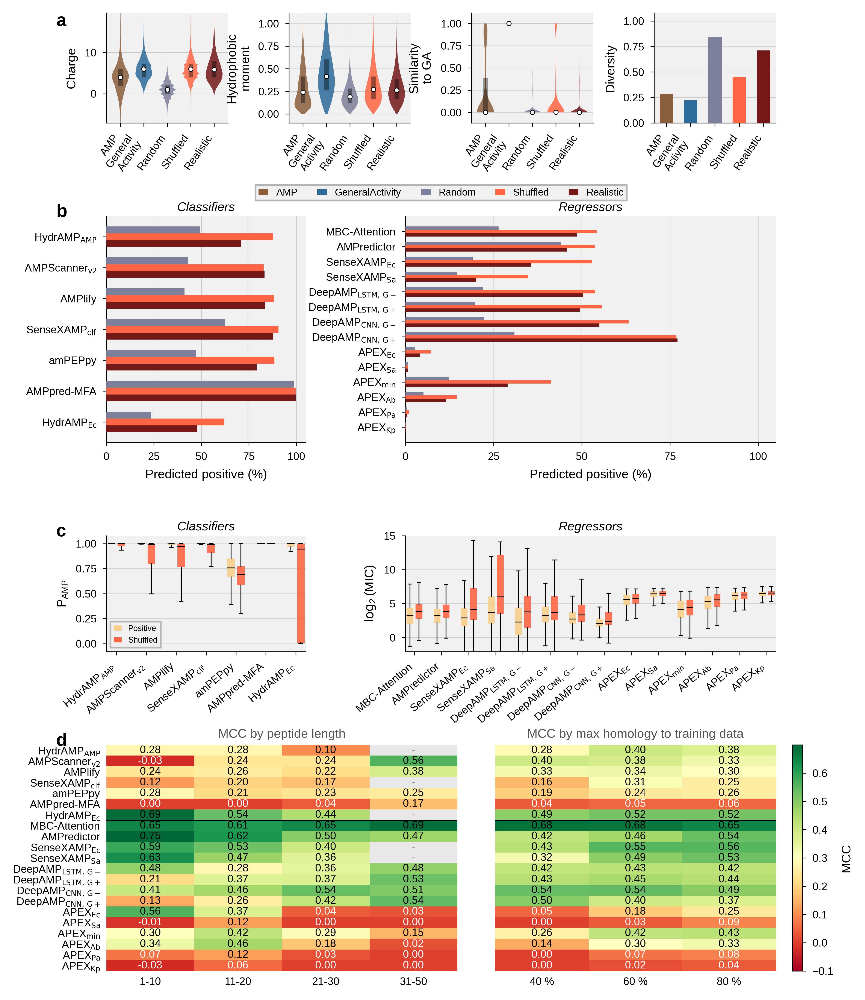

In [7]:
# Figure 4: plot from cache

def _lj(name):
    p = CACHE_DIR / name
    if p.exists(): return json.load(open(p))
    log.warning(f"  Missing: {p}"); return None

physchem = _lj("physchem.json") or {}
coverage = _lj("coverage.json") or {}
sim_to_ga = _lj("sim_to_ga.json") or {}
pp_rates = _lj("predicted_positive.json") or {}
paired_scores = _lj("paired_scores.json") or {}
length_mcc_d = _lj("length_mcc.json") or {}
homology_mcc_d = _lj("homology_mcc.json") or {}

ds_order = list(DATASET_PAL.keys())
ds_labels = ["AMP", "General\nActivity", "Random", "Shuffled", "Realistic"]
ds_colors = list(DATASET_PAL.values())
categories = ["Random", "Shuffled", "Realistic"]
BAR_COLORS_S = {"Random": RANDOM_COLOR, "Shuffled": SHUFFLED_COLOR, "Realistic": REALISTIC_COLOR}

def _sn4(mid): return CLF_FIG4.get(mid) or REG_FIG4.get(mid) or MODEL_DISPLAY.get(mid, mid)

def draw_violins(ax, data_list, colors, labels, ylabel, show_x=True):
    parts = ax.violinplot(data_list, showmeans=False, showmedians=False, showextrema=False,
                          widths=0.72, bw_method="silverman", points=80)
    for body, c in zip(parts["bodies"], colors):
        body.set_facecolor(c); body.set_edgecolor("none"); body.set_alpha(0.85)
    for i, d in enumerate(data_list):
        q1,q2,q3 = np.percentile(d, [25,50,75]); x = i+1
        ax.vlines(x, q1, q3, color="black", lw=2.5, alpha=0.4, zorder=4)
        ax.scatter(x, q2, fc="white", ec="black", s=6, zorder=5, lw=0.4)
    ax.set_xticks(range(1, len(data_list)+1))
    ax.set_xticklabels(labels if show_x else [], rotation=55, ha="right", fontsize=FS_TICK)
    av = np.concatenate(data_list); lo,hi = np.quantile(av, 0.005), np.quantile(av, 0.995)
    ax.set_ylim(lo-(hi-lo)*0.12, hi+(hi-lo)*0.12)
    ax.set_ylabel(ylabel, fontsize=FS_LABEL); style_ax(ax)

fig4 = plt.figure(figsize=(MAX_WIDTH, MAX_HEIGHT), dpi=DPI)
outer = gridspec.GridSpec(4, 1, height_ratios=[0.38, 0.78, 0.40, 0.78],
    hspace=0.55, left=0.08, right=0.88, top=0.97, bottom=0.04)

# Panel a
r1 = gridspec.GridSpecFromSubplotSpec(1, 4, subplot_spec=outer[0], wspace=0.50)
for pi, (dn, key) in enumerate([("Charge","charge"),("Hydrophobic\nmoment","hydrophobic_moment"),
                                  ("Similarity\nto GA","_sim_to_ga")]):
    ax = fig4.add_subplot(r1[0, pi])
    data = []
    for ds in ds_order:
        vals = sim_to_ga.get(ds,[]) if key=="_sim_to_ga" else physchem.get(ds,{}).get(key,[])
        data.append(np.array(vals or [0.0], dtype=float))
    draw_violins(ax, data, ds_colors, ds_labels, dn)

axcov = fig4.add_subplot(r1[0, 3])
axcov.bar(range(len(ds_labels)), [coverage.get(ds,0) for ds in ds_order],
          color=ds_colors, ec="none", width=0.55, zorder=3)
axcov.set_xticks(range(len(ds_labels))); axcov.set_xticklabels(ds_labels, rotation=55, ha="right", fontsize=FS_TICK)
axcov.set_ylim(0, 1.08); axcov.yaxis.set_major_locator(plt.MultipleLocator(0.25))
axcov.set_ylabel("Diversity", fontsize=FS_LABEL); style_ax(axcov)

fig4.legend(handles=[Patch(fc=c, label=n) for n,c in DATASET_PAL.items()], loc="lower center",
    bbox_to_anchor=(0.48, outer[0].get_position(fig4).y0-0.08), frameon=True, fancybox=False,
    edgecolor="0.7", framealpha=0.95, fontsize=FS_LEGEND, handlelength=1, handleheight=0.6,
    labelspacing=0.4, borderpad=0.3, ncol=5)
fig4.text(0.02, 0.97, "a", fontsize=FS_PANEL, fontweight="bold", va="top", transform=fig4.transFigure)

# Panel b
r2 = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=outer[1], wspace=0.35, width_ratios=[0.7,1.3])
def draw_hbars(ax, md, title):
    ns = list(md.values()); ids = list(md.keys()); nm = len(ns); y = np.arange(nm); h = 0.22
    for j, cat in enumerate(categories):
        vals = [pp_rates.get(mid,{}).get(cat,float("nan")) for mid in ids]
        ax.barh(y+(j-1)*h, vals, h, color=BAR_COLORS_S[cat], ec="none", zorder=3, label=cat)
    ax.set_yticks(y); ax.set_yticklabels(ns, fontsize=FS_TICK)
    ax.set_xlim(0, 105); ax.xaxis.set_major_locator(plt.MultipleLocator(25)); ax.invert_yaxis()
    ax.set_xlabel("Predicted positive (%)", fontsize=FS_LABEL); style_ax(ax)
    ax.grid(axis="x", color=GRID_CLR, lw=0.3, zorder=0); ax.grid(axis="y", visible=False)
    ax.set_title(title, fontsize=FS_TITLE, fontstyle="italic", pad=3)

draw_hbars(fig4.add_subplot(r2[0,0]), CLF_FIG4, "Classifiers")
draw_hbars(fig4.add_subplot(r2[0,1]), REG_FIG4, "Regressors")
fig4.text(0.02, outer[1].get_position(fig4).y1+0.012, "b", fontsize=FS_PANEL, fontweight="bold", va="top", transform=fig4.transFigure)

# Panel c
r3 = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=outer[2], wspace=0.35, width_ratios=[0.7,1.3])
def draw_paired(ax, md, title, is_clf=True):
    ids=list(md.keys()); ns=list(md.values()); data=[]; pos=[]; cols=[]; mt=[]
    for im, mid in enumerate(ids):
        ps=paired_scores.get(mid,{}); p=ps.get("positive",[]) or [0.0]; s=ps.get("shuffled",[]) or [0.0]
        b=im*3; data.extend([p,s]); pos.extend([b,b+1]); cols.extend([ACTIVE_COLOR, SHUFFLED_COLOR]); mt.append(b+0.5)
    bp=ax.boxplot(data, positions=pos, patch_artist=True, widths=0.75, showfliers=False,
        boxprops=dict(lw=0), medianprops=dict(lw=0.5,color="k"), whiskerprops=dict(lw=0.5), capprops=dict(lw=0.5))
    for p,c in zip(bp["boxes"],cols): p.set_facecolor(c); p.set_alpha(0.9)
    ax.set_xticks(mt); ax.set_xticklabels(ns, rotation=40, ha="right", fontsize=FS_TICK)
    style_ax(ax); ax.grid(axis="x", visible=False)
    avl=[np.array(d,dtype=float) for d in data if len(d)>1]
    if avl:
        av=np.concatenate(avl); lo,hi=np.quantile(av,0.005),np.quantile(av,0.995); pad=(hi-lo)*0.08
        ax.set_ylim(lo-pad, hi+pad)
    ax.set_ylabel("$P_{AMP}$" if is_clf else r"$\log_2$(MIC)", fontsize=FS_LABEL)
    ax.set_title(title, fontsize=FS_TITLE, fontstyle="italic", pad=3)

ax_cp = fig4.add_subplot(r3[0,0])
draw_paired(ax_cp, CLF_FIG4, "Classifiers", True)
ax_cp.legend(handles=[Patch(fc=ACTIVE_COLOR,label="Positive"),Patch(fc=SHUFFLED_COLOR,label="Shuffled")],
    loc="lower left", frameon=True, fancybox=False, edgecolor="0.7", framealpha=0.9,
    fontsize=4.5, handlelength=1, handleheight=0.6)
draw_paired(fig4.add_subplot(r3[0,1]), REG_FIG4, "Regressors", False)
fig4.text(0.02, outer[2].get_position(fig4).y1+0.012, "c", fontsize=FS_PANEL, fontweight="bold", va="top", transform=fig4.transFigure)

# Panel d
r4 = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=outer[3], wspace=0.12, width_ratios=[1,0.8])
nhm = len(HEATMAP_ORDER); ncl = len(CLF_FIG4)
lm = np.full((nhm, len(LENGTH_TASKS)), np.nan); hm = np.full((nhm, len(HOMOLOGY_TASKS)), np.nan)
for i, mid in enumerate(HEATMAP_ORDER):
    for j, t in enumerate(LENGTH_TASKS):
        if mid in length_mcc_d: lm[i,j] = length_mcc_d[mid].get(t, np.nan)
    for j, t in enumerate(HOMOLOGY_TASKS):
        if mid in homology_mcc_d: hm[i,j] = homology_mcc_d[mid].get(t, np.nan)

cm4 = matplotlib.colormaps["RdYlGn"]; cm4.set_bad("#e8e8e8")
nm4 = mcolors.TwoSlopeNorm(vmin=-0.1, vcenter=0.3, vmax=0.7)

for mi, (mat, labs, title, show_y) in enumerate([
    (lm, LENGTH_LABELS, "MCC by peptide length", True),
    (hm, HOM_LABELS, "MCC by max homology to training data", False)]):
    ax = fig4.add_subplot(r4[0, mi])
    for sp in ax.spines.values(): sp.set_visible(False)
    im = ax.imshow(mat, aspect="auto", cmap=cm4, norm=nm4, interpolation="nearest")
    for i in range(mat.shape[0]):
        for j in range(mat.shape[1]):
            v = mat[i,j]
            if np.isnan(v): ax.text(j,i,"-",ha="center",va="center",fontsize=FS_TICK,color="#999")
            else: ax.text(j,i,f"{v:.2f}",ha="center",va="center",fontsize=FS_TICK,color="white" if v<0.1 else "black")
    ax.set_xticks(np.arange(len(labs))); ax.set_xticklabels(labs, fontsize=FS_TICK)
    ax.set_yticks(np.arange(nhm))
    ax.set_yticklabels([_sn4(m) for m in HEATMAP_ORDER] if show_y else [], fontsize=FS_TICK)
    ax.tick_params(axis="both", length=0); ax.set_title(title, fontsize=FS_TITLE, pad=4, color="#555")
    ax.axhline(ncl-0.5, color="black", lw=0.8)

cba = fig4.add_axes([0.90, outer[3].get_position(fig4).y0, 0.012, outer[3].get_position(fig4).height])
cb4 = fig4.colorbar(im, cax=cba); cb4.ax.tick_params(labelsize=FS_TICK); cb4.set_label("MCC", fontsize=FS_LABEL)
fig4.text(0.02, outer[3].get_position(fig4).y1+0.012, "d", fontsize=FS_PANEL, fontweight="bold", va="top", transform=fig4.transFigure)

save_figure(fig4, "figure4")
plt.show()

## Figure 5: MD simulations and ML predictor comparison

**Alt text:** Eight-panel figure (4 rows x 2 columns). Left = control,
right = activity cliffs. (a,b) S-score split violins. (c,d) AUC heatmaps.
(e,f) ZP-score AUC bars. (g,h) ML regressor MIC distributions.

INFO: maxp pruned
INFO: cmap pruned
INFO: kern dropped
INFO: post pruned
INFO: FFTM dropped
INFO: GPOS pruned
INFO: GSUB pruned
INFO: glyf pruned
INFO: Added gid0 to subset
INFO: Added first four glyphs to subset
INFO: Closing glyph list over 'MATH': 17 glyphs before
INFO: Glyph names: ['.notdef', '.null', 'E', 'G', 'S', 'a', 'c', 'g', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'plus', 'space']
INFO: Glyph IDs:   [0, 1, 2, 3, 14, 40, 42, 54, 68, 70, 74, 76, 79, 80, 81, 82, 3228]
INFO: Closed glyph list over 'MATH': 17 glyphs after
INFO: Glyph names: ['.notdef', '.null', 'E', 'G', 'S', 'a', 'c', 'g', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'plus', 'space']
INFO: Glyph IDs:   [0, 1, 2, 3, 14, 40, 42, 54, 68, 70, 74, 76, 79, 80, 81, 82, 3228]
INFO: Closing glyph list over 'GSUB': 17 glyphs before
INFO: Glyph names: ['.notdef', '.null', 'E', 'G', 'S', 'a', 'c', 'g', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'plus', 'space']
INFO: Glyph IDs:   [0, 1, 2, 

Saved /home/pszymczak/code/battleamp-snakemake/figures/figure5.pdf
Saved /home/pszymczak/code/battleamp-snakemake/figures/figure5.png


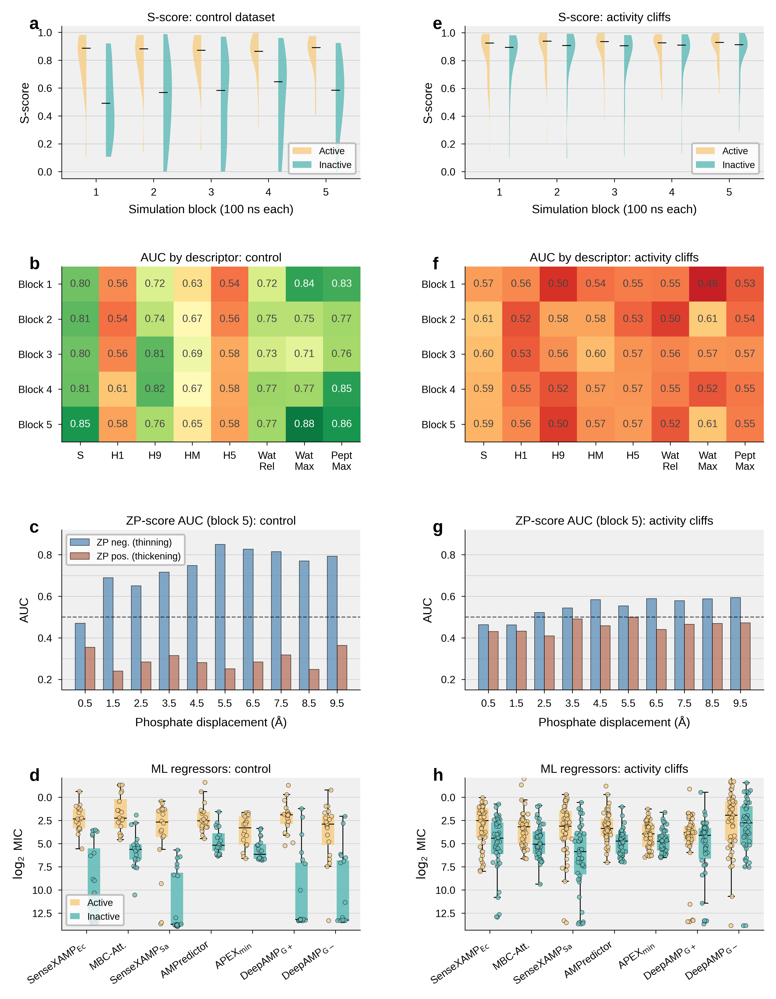

In [8]:
# Figure 5: MD simulations and ML predictor comparison
from sklearn.metrics import roc_auc_score

safe5 = pd.read_csv(MD_DIR / "safe" / "summary_aa_dual.csv")
paired5 = pd.read_csv(MD_DIR / "paired" / "summary_aa_dual.csv")
safe_avg = safe5.groupby(["sequence","is_active","metric","step"])["value"].mean().reset_index()
paired_avg = paired5.groupby(["sequence","is_active","metric","step"])["value"].mean().reset_index()

safe_ml = pd.read_csv(RESULTS_ROOT / "aggregated" / "control-md_predictions.tsv", sep="\t")
y_safe5 = (safe_ml["true_class"] == "AMP").values

paired_gt = pd.read_csv(MD_DIR / "activity-cliffs.tsv", sep="\t")
paired_gt["MIC_clean"] = paired_gt["MIC [ug/ml]"].astype(str).str.replace(",","").astype(float)
paired_pred = pd.read_csv(RESULTS_ROOT / "aggregated" / "activity-cliffs_predictions.tsv", sep="\t")
pair_labels = {}
for i in range(len(paired_gt)//2):
    pair_labels[paired_gt.iloc[2*i]["sequence"].upper()] = True
    pair_labels[paired_gt.iloc[2*i+1]["sequence"].upper()] = False

STEPS = [1,2,3,4,5]

def plot_split_violins(ax, df, mc="S", yl="S-score", title=""):
    data = df[df["metric"]==mc].copy(); data["Status"]=data["is_active"].map({1:"Active",0:"Inactive"})
    steps = sorted(data["step"].unique())
    for st, off, clr in [("Active",-0.17,ACTIVE_COLOR),("Inactive",0.17,INACTIVE_COLOR)]:
        sub = data[data["Status"]==st]
        dbs = [sub[sub["step"]==s]["value"].dropna().values for s in steps]
        if all(len(d)==0 for d in dbs): continue
        vp = ax.violinplot(dbs, positions=np.array(steps)+off, widths=0.3, showmedians=True, showextrema=False)
        for body in vp["bodies"]:
            body.set_facecolor(clr); body.set_alpha(0.85); body.set_edgecolor("none"); body.set_linewidth(0)
            m = np.mean(body.get_paths()[0].vertices[:,0])
            if off<0: body.get_paths()[0].vertices[:,0] = np.clip(body.get_paths()[0].vertices[:,0], -np.inf, m)
            else: body.get_paths()[0].vertices[:,0] = np.clip(body.get_paths()[0].vertices[:,0], m, np.inf)
        vp["cmedians"].set_color("black"); vp["cmedians"].set_linewidth(0.5)
    for y in np.arange(0,1.1,0.2): ax.axhline(y, color=GRID_CLR, lw=0.3, zorder=0)
    ax.set_xticks(steps); ax.set_xlabel("Simulation block (100 ns each)")
    ax.set_ylabel(yl); ax.set_title(title, fontsize=FS_TITLE, pad=3)
    ax.set_xlim(0.4, 5.6); style_ax(ax)

def compute_auc_mat(df, metrics, steps):
    mat = np.full((len(steps), len(metrics)), np.nan)
    for j, mc in enumerate(metrics):
        for i, st in enumerate(steps):
            sub = df[(df["metric"]==mc)&(df["step"]==st)]
            if len(sub)<5 or len(np.unique(sub["is_active"]))<2: continue
            try: mat[i,j] = roc_auc_score(sub["is_active"].values, sub["value"].values)
            except: pass
    for j in range(len(metrics)):
        c=mat[:,j]; v=c[~np.isnan(c)]
        if len(v)>0 and np.mean(v)<0.5: mat[:,j]=1-c
    return mat

def plot_auc_hm(ax, mat, metrics, steps, title, vmin=0.35, vmax=0.90, ml=None):
    im = ax.imshow(mat, cmap="RdYlGn", aspect="auto", vmin=vmin, vmax=vmax, interpolation="nearest")
    for i in range(len(steps)):
        for j in range(len(metrics)):
            v=mat[i,j]
            if not np.isnan(v):
                ax.text(j,i,f"{v:.2f}",ha="center",va="center",fontsize=FS_TICK,color="white" if v>0.82 or v<0.42 else "#444")
    ax.set_xticks(range(len(metrics))); ax.set_xticklabels(ml or metrics, fontsize=FS_TICK)
    ax.set_yticks(range(len(steps))); ax.set_yticklabels([f"Block {s}" for s in steps])
    ax.set_title(title, fontsize=FS_TITLE, pad=3); return im

def plot_zp(ax, df, step, title, legend=True):
    zn=[f"ZP-{b}" for b in ["0.5","1.5","2.5","3.5","4.5","5.5","6.5","7.5","8.5","9.5"]]
    zp=[f"ZP{b}" for b in ["0.5","1.5","2.5","3.5","4.5","5.5","6.5","7.5","8.5","9.5"]]
    def ga(bins):
        a=[]
        for mc in bins:
            sub=df[(df["metric"]==mc)&(df["step"]==step)]
            if len(sub)<5 or len(np.unique(sub["is_active"]))<2: a.append(np.nan); continue
            try: a.append(roc_auc_score(sub["is_active"].values, sub["value"].values))
            except: a.append(np.nan)
        return a
    an=ga(zn); ap=ga(zp); x=np.arange(len(zn)); w=0.35
    ax.bar(x-w/2,an,w,color=ZP_NEG_COLOR,alpha=0.75,ec="black",lw=0.3,label="ZP neg. (thinning)")
    ax.bar(x+w/2,ap,w,color=ZP_POS_COLOR,alpha=0.75,ec="black",lw=0.3,label="ZP pos. (thickening)")
    ax.axhline(0.5,color="black",lw=0.6,ls="--",alpha=0.6)
    for y in [0.3,0.4,0.6,0.7,0.8]: ax.axhline(y,color=GRID_CLR,lw=0.3,zorder=0)
    ax.set_xticks(x); ax.set_xticklabels([f"{v:.1f}" for v in [0.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5]], fontsize=FS_TICK)
    ax.set_xlabel("Phosphate displacement (\u00c5)"); ax.set_ylabel("AUC"); ax.set_ylim(0.15,0.92)
    ax.set_title(title, fontsize=FS_TITLE, pad=3)
    if legend: ax.legend(loc="upper left", frameon=True, facecolor="white", edgecolor="0.7", fontsize=FS_LEGEND)
    style_ax(ax)

def plot_ml_box(ax, dd, models, title):
    n=len(models); pa=np.arange(n)-0.18; pi=np.arange(n)+0.18; bw=0.30
    np.random.seed(42)
    for idx,(mk,_,_,dn) in enumerate(models):
        act,ina=dd.get(mk,([],[]))
        if len(act)==0 or len(ina)==0: continue
        al=np.log2(np.clip(act,0.01,None)); il=np.log2(np.clip(ina,0.01,None))
        for v,p,c in [(al,pa[idx],ACTIVE_COLOR),(il,pi[idx],INACTIVE_COLOR)]:
            ax.boxplot([v],positions=[p],widths=bw,patch_artist=True,showfliers=False,zorder=2,
                boxprops=dict(fc=c,lw=0,alpha=0.9),medianprops=dict(color="black",lw=0.5),
                whiskerprops=dict(color="black",lw=0.5),capprops=dict(color="black",lw=0.5))
            ax.scatter(p+np.random.normal(0,0.04,len(v)),v,s=6,color=c,ec="black",lw=0.2,alpha=0.8,zorder=3)
    ax.set_xticks(np.arange(n)); ax.set_xticklabels([m[3] for m in models],fontsize=FS_TICK,rotation=35,ha="right")
    ax.set_xlim(-0.6,n-0.4); ax.set_ylabel(r"$\log_2$ MIC"); ax.set_title(title,fontsize=FS_TITLE,pad=3); style_ax(ax)

# Prepare ML data
ml_safe = {}
for mk,col,_,_ in ML_MODELS_FIG5:
    mask=safe_ml[col].notna(); vals=safe_ml.loc[mask,col].values; lab=y_safe5[mask.values]
    ml_safe[mk] = (vals[lab], vals[~lab])
ml_cliff = {}
for mk,_,cv,_ in ML_MODELS_FIG5:
    sub=paired_pred[(paired_pred["variant"]==cv)&paired_pred["MIC"].notna()]; am,im=[],[]
    for _,r in sub.iterrows():
        seq=str(r["sequence"]).upper()
        if seq in pair_labels:
            if pair_labels[seq]: am.append(r["MIC"])
            else: im.append(r["MIC"])
    ml_cliff[mk] = (np.array(am), np.array(im))

# Build figure
fig5 = plt.figure(figsize=(MAX_WIDTH, MAX_HEIGHT), dpi=DPI)
gs5 = gridspec.GridSpec(4, 2, hspace=0.55, wspace=0.35, left=0.09, right=0.96, top=0.97, bottom=0.06,
                        height_ratios=[1, 1.15, 1.05, 1.0])

LMD = [Patch(fc=ACTIVE_COLOR,alpha=0.85,ec="none",label="Active"),
       Patch(fc=INACTIVE_COLOR,alpha=0.85,ec="none",label="Inactive")]
ax5a=fig5.add_subplot(gs5[0,0]); plot_split_violins(ax5a,safe_avg,"S","S-score","S-score: control dataset")
ax5a.legend(handles=LMD,loc="lower right",frameon=True,facecolor="white",edgecolor="0.7")
ax5b=fig5.add_subplot(gs5[0,1]); plot_split_violins(ax5b,paired_avg,"S","S-score","S-score: activity cliffs")
ax5b.legend(handles=LMD,loc="lower right",frameon=True,facecolor="white",edgecolor="0.7")

hm5=["S","H1","H9","HM","H5","WAT_BUR_REL","WAT_BUR_MAX","PEPT_BUR_MAX"]
hml=["S","H1","H9","HM","H5","Wat\nRel","Wat\nMax","Pept\nMax"]
sa5=compute_auc_mat(safe_avg,hm5,STEPS); pa5=compute_auc_mat(paired_avg,hm5,STEPS)
aav=np.concatenate([sa5[~np.isnan(sa5)],pa5[~np.isnan(pa5)]])
vmi=max(0.35,np.floor(aav.min()*20)/20); vma=min(0.92,np.ceil(aav.max()*20)/20)
plot_auc_hm(fig5.add_subplot(gs5[1,0]),sa5,hm5,STEPS,"AUC by descriptor: control",vmi,vma,hml)
plot_auc_hm(fig5.add_subplot(gs5[1,1]),pa5,hm5,STEPS,"AUC by descriptor: activity cliffs",vmi,vma,hml)
plot_zp(fig5.add_subplot(gs5[2,0]),safe_avg,5,"ZP-score AUC (block 5): control")
plot_zp(fig5.add_subplot(gs5[2,1]),paired_avg,5,"ZP-score AUC (block 5): activity cliffs",False)

ax5g=fig5.add_subplot(gs5[3,0]); plot_ml_box(ax5g,ml_safe,ML_MODELS_FIG5,"ML regressors: control")
ax5h=fig5.add_subplot(gs5[3,1]); plot_ml_box(ax5h,ml_cliff,ML_MODELS_FIG5,"ML regressors: activity cliffs")
allml=[]
for d in [ml_safe,ml_cliff]:
    for a,i in d.values():
        if len(a)>0: allml.extend(np.log2(np.clip(a,0.01,None)))
        if len(i)>0: allml.extend(np.log2(np.clip(i,0.01,None)))
ymi=np.percentile(allml,0.5)-0.5; yma=np.percentile(allml,99.5)+0.5
ax5g.set_ylim(ymi,yma); ax5h.set_ylim(ymi,yma); ax5g.invert_yaxis(); ax5h.invert_yaxis()
ax5g.legend(handles=[Patch(fc=ACTIVE_COLOR,lw=0,alpha=0.9,label="Active"),
    Patch(fc=INACTIVE_COLOR,lw=0,alpha=0.9,label="Inactive")],
    fontsize=FS_LEGEND,loc="lower left",frameon=True,facecolor="white",edgecolor="0.7",handlelength=1,handleheight=0.6)

for lbl,ax in [("a",ax5a),("b",fig5.axes[2]),("c",fig5.axes[4]),("d",ax5g),
               ("e",ax5b),("f",fig5.axes[3]),("g",fig5.axes[5]),("h",ax5h)]:
    p=ax.get_position()
    fig5.text(p.x0-0.04,p.y1+0.01,lbl,fontsize=FS_PANEL,fontweight="bold",va="top",transform=fig5.transFigure)

save_figure(fig5, "figure5")
plt.show()

## Supplementary: Sankey dataset overlap

INFO: maxp pruned
INFO: cmap pruned
INFO: kern dropped
INFO: post pruned
INFO: FFTM dropped
INFO: GPOS pruned
INFO: GSUB pruned
INFO: glyf pruned
INFO: Added gid0 to subset
INFO: Added first four glyphs to subset
INFO: Closing glyph list over 'GSUB': 43 glyphs before
INFO: Glyph names: ['.notdef', '.null', 'A', 'B', 'D', 'G', 'I', 'M', 'P', 'S', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'i', 'l', 'n', 'nine', 'nonmarkingreturn', 'o', 'one', 'parenleft', 'parenright', 'r', 's', 'seven', 'slash', 't', 'three', 'two', 'uni00A0', 'uni00AD', 'v', 'y', 'zero']
INFO: Glyph IDs:   [0, 1, 2, 3, 11, 12, 15, 16, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 32, 36, 37, 39, 42, 44, 48, 51, 54, 68, 69, 70, 71, 72, 74, 75, 76, 79, 81, 82, 85, 86, 87, 89, 92]
INFO: Closed glyph list over 'GSUB': 43 glyphs after
INFO: Glyph names: ['.notdef', '.null', 'A', 'B', 'D', 'G', 'I', 'M', 'P', 'S', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'equal', 'five', 'four', 'g', 'h', 'i',

Saved /home/pszymczak/code/battleamp-snakemake/figures/sankey_dataset_overlap.pdf
Saved /home/pszymczak/code/battleamp-snakemake/figures/sankey_dataset_overlap.png


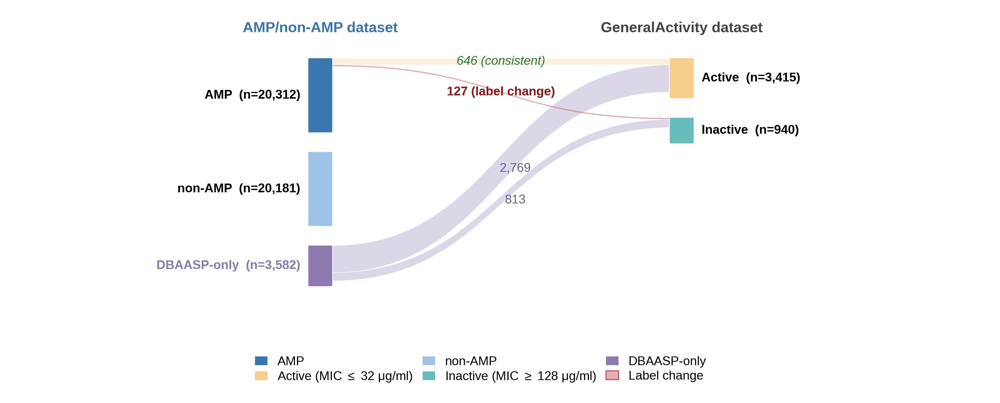

In [9]:
# Supplementary: Sankey dataset overlap
from matplotlib.path import Path as MplPath

def load_labels(path):
    d={}
    with open(path, newline="") as f:
        for row in csv.DictReader(f, delimiter="\t"):
            d[row["sequence"].strip()] = row.get("label","").strip()
    return d

amp_l = load_labels(TASKS_DIR/"amp"/"labels.tsv")
gen_l = load_labels(TASKS_DIR/"broad_activity"/"labels.tsv")
amp_pos_s = {s for s,l in amp_l.items() if l=="AMP"}
gen_pos_s = {s for s,l in gen_l.items() if l=="AMP"}; gen_neg_s = {s for s,l in gen_l.items() if l=="non-AMP"}
dbaasp_only = set(gen_l.keys()) - set(amp_l.keys())
n_amp_pos = sum(1 for l in amp_l.values() if l=="AMP"); n_amp_neg = sum(1 for l in amp_l.values() if l=="non-AMP")
D = {"n_amp_pos":n_amp_pos,"n_amp_neg":n_amp_neg,"n_gen_act":len(gen_pos_s),"n_gen_inact":len(gen_neg_s),
     "n_dbaasp_only":len(dbaasp_only),"amp_pos_to_active":len(amp_pos_s&gen_pos_s),
     "amp_pos_to_inactive":len(amp_pos_s&gen_neg_s),"dbaasp_only_active":len(dbaasp_only&gen_pos_s),
     "dbaasp_only_inactive":len(dbaasp_only&gen_neg_s)}

C_AP="#3A76AF";C_AN="#9DC3E6";C_GA=ACTIVE_COLOR;C_GI=INACTIVE_COLOR;C_DB="#8C7BAE";C_LC="#C44E52"
def _bz(ax,x0,y0t,y0b,x1,y1t,y1b,clr,z=1):
    cx=(x0+x1)/2
    v=[(x0,y0t),(cx,y0t),(cx,y1t),(x1,y1t),(x1,y1b),(cx,y1b),(cx,y0b),(x0,y0b),(x0,y0t)]
    c=[MplPath.MOVETO]+[MplPath.CURVE4]*3+[MplPath.LINETO]+[MplPath.CURVE4]*3+[MplPath.CLOSEPOLY]
    ax.add_patch(mpatches.PathPatch(MplPath(v,c),fc=clr,ec="none",lw=0,zorder=z))

fsk,axk=plt.subplots(figsize=(MAX_WIDTH,2.5), dpi=DPI); axk.set_xlim(-0.01,1.01); axk.set_ylim(-0.05,1.05); axk.axis("off")
nw=0.022; xL=0.30; xR=0.68; ref=max(D["n_amp_pos"],D["n_amp_neg"])
sc=0.22/(ref**0.35); gap=0.06
def nh(n): return max(sc*(n**0.35),0.025) if n>0 else 0
h_ap=nh(D["n_amp_pos"]);h_an=nh(D["n_amp_neg"]);h_db=nh(D["n_dbaasp_only"]);h_ga=nh(D["n_gen_act"]);h_gi=nh(D["n_gen_inact"])
af=[D["amp_pos_to_active"],D["amp_pos_to_inactive"],D["dbaasp_only_active"],D["dbaasp_only_inactive"]]
sf=0.08/max(af)
def fh(n): return max(sf*n,0.003)

yt=0.92
y_ap_t=yt;y_ap_b=yt-h_ap;y_an_t=y_ap_b-gap;y_an_b=y_an_t-h_an;y_db_t=y_an_b-gap;y_db_b=y_db_t-h_db
y_ga_t=yt;y_ga_b=yt-h_ga;y_gi_t=y_ga_b-gap;y_gi_b=y_gi_t-h_gi
def nd(x,yb,w,ht,c):
    axk.add_patch(mpatches.FancyBboxPatch((x,yb),w,ht,boxstyle="round,pad=0.002",fc=c,ec="white",lw=0.4,zorder=5))
nd(xL,y_ap_b,nw,h_ap,C_AP);nd(xL,y_an_b,nw,h_an,C_AN);nd(xL,y_db_b,nw,h_db,C_DB)
nd(xR,y_ga_b,nw,h_ga,C_GA);nd(xR,y_gi_b,nw,h_gi,C_GI)

pad=0.01
for t,b,nm,n,c in [(y_ap_t,y_ap_b,"AMP",D["n_amp_pos"],"black"),(y_an_t,y_an_b,"non-AMP",D["n_amp_neg"],"black"),
    (y_db_t,y_db_b,"DBAASP-only",D["n_dbaasp_only"],C_DB)]:
    axk.text(xL-pad,(t+b)/2,f"{nm}  (n={n:,})",fontsize=FS_TICK,ha="right",va="center",fontweight="bold",color=c)
for t,b,nm,n in [(y_ga_t,y_ga_b,"Active",D["n_gen_act"]),(y_gi_t,y_gi_b,"Inactive",D["n_gen_inact"])]:
    axk.text(xR+nw+pad,(t+b)/2,f"{nm}  (n={n:,})",fontsize=FS_TICK,ha="left",va="center",fontweight="bold")

sp=0.001; al=0.30
fhc=fh(D["amp_pos_to_active"]);fhx=fh(D["amp_pos_to_inactive"]);fhda=fh(D["dbaasp_only_active"]);fhdi=fh(D["dbaasp_only_inactive"])
s1t=y_ap_t;s1b=s1t-fhc;d1t=y_ga_t;d1b=d1t-fhc
_bz(axk,xL+nw,s1t,s1b,xR,d1t,d1b,(*mcolors.to_rgb(C_GA),al),2)
s2t=s1b-sp;s2b=s2t-fhx;d2t=y_gi_t;d2b=d2t-fhx
_bz(axk,xL+nw,s2t,s2b,xR,d2t,d2b,(*mcolors.to_rgb(C_LC),0.45),3)
s3t=y_db_t;s3b=s3t-fhda;d3t=d1b-sp;d3b=d3t-fhda
_bz(axk,xL+nw,s3t,s3b,xR,d3t,d3b,(*mcolors.to_rgb(C_DB),al),2)
s4t=s3b-sp;s4b=s4t-fhdi;d4t=d2b-sp;d4b=d4t-fhdi
_bz(axk,xL+nw,s4t,s4b,xR,d4t,d4b,(*mcolors.to_rgb(C_DB),al),2)

mx=(xL+nw+xR)/2
def fm(*a): return sum(a)/len(a)
axk.text(mx,fm(s1t,s1b,d1t,d1b),f"{D['amp_pos_to_active']:,} (consistent)",fontsize=FS_TICK,ha="center",va="center",color="#2B7A3E",fontstyle="italic",zorder=10)
axk.text(mx,fm(s2t,s2b,d2t,d2b),f"{D['amp_pos_to_inactive']:,} (label change)",fontsize=FS_TICK,ha="center",va="center",color="#8B1A1A",fontweight="bold",zorder=10)
axk.text(mx+0.015,fm(s3t,s3b,d3t,d3b),f"{D['dbaasp_only_active']:,}",fontsize=FS_TICK,ha="center",va="center",color="#6B5F8A",zorder=10)
axk.text(mx+0.015,fm(s4t,s4b,d4t,d4b),f"{D['dbaasp_only_inactive']:,}",fontsize=FS_TICK,ha="center",va="center",color="#6B5F8A",zorder=10)
axk.text(xL+nw/2,0.99,"AMP/non-AMP dataset",fontsize=FS_LABEL,ha="center",va="bottom",fontweight="bold",color=C_AP)
axk.text(xR+nw/2,0.99,"GeneralActivity dataset",fontsize=FS_LABEL,ha="center",va="bottom",fontweight="bold",color="#444")

axk.legend(handles=[mpatches.Patch(fc=C_AP,label="AMP"),mpatches.Patch(fc=C_GA,label=r"Active (MIC $\leq$ 32 $\mu$g/ml)"),
    mpatches.Patch(fc=C_AN,label="non-AMP"),mpatches.Patch(fc=C_GI,label=r"Inactive (MIC $\geq$ 128 $\mu$g/ml)"),
    mpatches.Patch(fc=C_DB,label="DBAASP-only"),mpatches.Patch(fc=mcolors.to_rgba(C_LC,0.45),ec=C_LC,lw=0.5,label="Label change")],
    loc="lower center",bbox_to_anchor=(0.48,-0.03),ncol=3,fontsize=FS_TICK,frameon=False,
    handlelength=1,handleheight=0.7,columnspacing=0.8,labelspacing=0.25)
fsk.tight_layout(pad=0.1); save_figure(fsk,"sankey_dataset_overlap"); plt.show()

## Supplementary: MIC distributions

Uses standardised ACTIVE_COLOR / INACTIVE_COLOR.

INFO: maxp pruned
INFO: cmap pruned
INFO: kern dropped
INFO: post pruned
INFO: FFTM dropped
INFO: GPOS pruned
INFO: GSUB pruned
INFO: glyf pruned
INFO: Added gid0 to subset
INFO: Added first four glyphs to subset
INFO: Closing glyph list over 'GSUB': 23 glyphs before
INFO: Glyph names: ['.notdef', '.null', 'A', 'E', 'K', 'P', 'S', 'a', 'b', 'c', 'e', 'g', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'space', 'u']
INFO: Glyph IDs:   [0, 1, 2, 3, 36, 40, 46, 51, 54, 68, 69, 70, 72, 74, 76, 79, 80, 81, 82, 83, 85, 86, 88]
INFO: Closed glyph list over 'GSUB': 23 glyphs after
INFO: Glyph names: ['.notdef', '.null', 'A', 'E', 'K', 'P', 'S', 'a', 'b', 'c', 'e', 'g', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'p', 'r', 's', 'space', 'u']
INFO: Glyph IDs:   [0, 1, 2, 3, 36, 40, 46, 51, 54, 68, 69, 70, 72, 74, 76, 79, 80, 81, 82, 83, 85, 86, 88]
INFO: Closing glyph list over 'glyf': 23 glyphs before
INFO: Glyph names: ['.notdef', '.null', 'A', 'E', 'K', 'P', 'S', 'a', 'b', 'c', 

Saved /home/pszymczak/code/battleamp-snakemake/figures/mic_distributions.pdf
Saved /home/pszymczak/code/battleamp-snakemake/figures/mic_distributions.png


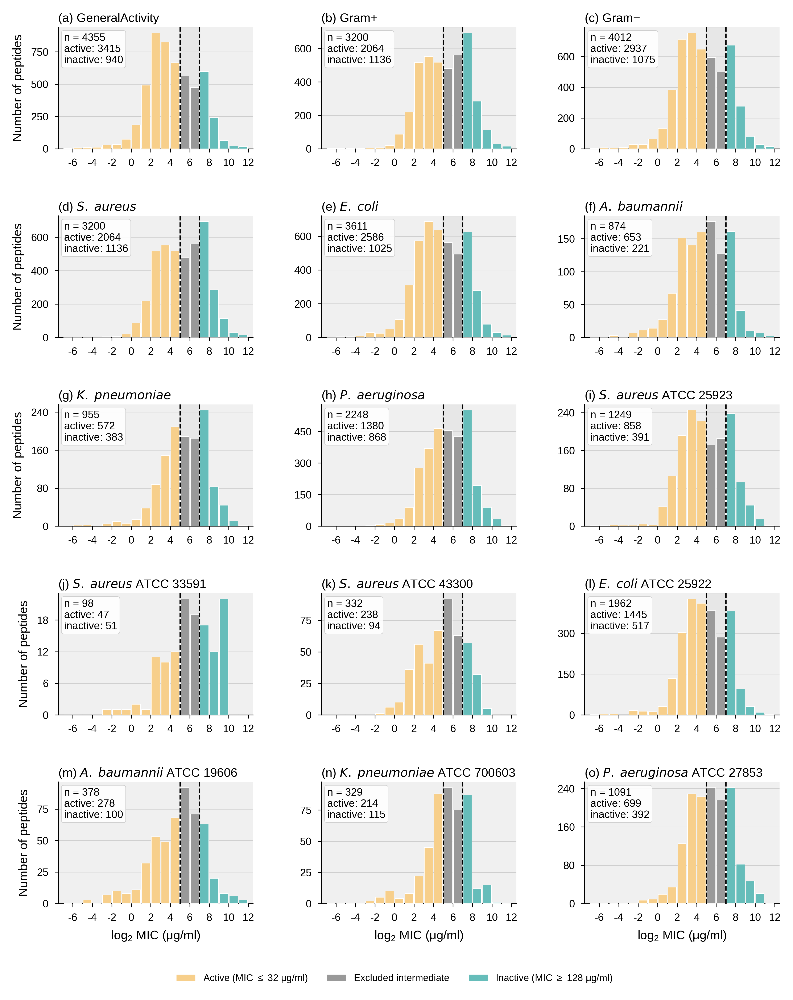

In [10]:
# Supplementary: MIC distributions

ACTIVITY_DIR = DATA_ROOT / "activity"
ACT_THR = 32; INACT_THR = 128
ACT_L2 = np.log2(ACT_THR); INACT_L2 = np.log2(INACT_THR)
L2_MIN = -7; L2_MAX = 12
BIN_EDGES = np.arange(L2_MIN, L2_MAX+1, dtype=float)
XTICK_L2 = np.array([-6,-4,-2,0,2,4,6,8,10,12], dtype=float)

DATASETS_MIC = [
    ("a","GeneralActivity","csv","broad.csv",(3415,940)),
    ("b","Gram+","csv","gramplus.csv",(2064,1136)),
    ("c","Gram$-$","csv","gramminus.csv",(2937,1075)),
    ("d",r"$\it{S.}$ $\it{aureus}$","filter",("gramplus.csv","species","Staphylococcus aureus"),(2064,1136)),
    ("e",r"$\it{E.}$ $\it{coli}$","filter",("gramminus.csv","species","Escherichia coli"),(2586,1025)),
    ("f",r"$\it{A.}$ $\it{baumannii}$","filter",("gramminus.csv","species","Acinetobacter baumannii"),(653,221)),
    ("g",r"$\it{K.}$ $\it{pneumoniae}$","filter",("gramminus.csv","species","Klebsiella pneumoniae"),(572,383)),
    ("h",r"$\it{P.}$ $\it{aeruginosa}$","filter",("gramminus.csv","species","Pseudomonas aeruginosa"),(1380,868)),
    ("i",r"$\it{S.}$ $\it{aureus}$ ATCC 25923","csv",os.path.join("strain","staphylococcusaureusatcc25923.csv"),(858,391)),
    ("j",r"$\it{S.}$ $\it{aureus}$ ATCC 33591","csv",os.path.join("strain","staphylococcusaureusatcc33591.csv"),(47,51)),
    ("k",r"$\it{S.}$ $\it{aureus}$ ATCC 43300","csv",os.path.join("strain","staphylococcusaureusatcc43300.csv"),(238,94)),
    ("l",r"$\it{E.}$ $\it{coli}$ ATCC 25922","csv",os.path.join("strain","escherichiacoliatcc25922.csv"),(1445,517)),
    ("m",r"$\it{A.}$ $\it{baumannii}$ ATCC 19606","csv",os.path.join("strain","acinetobacterbaumanniiatcc19606.csv"),(278,100)),
    ("n",r"$\it{K.}$ $\it{pneumoniae}$ ATCC 700603","csv",os.path.join("strain","klebsiellapneumoniaeatcc700603.csv"),(214,115)),
    ("o",r"$\it{P.}$ $\it{aeruginosa}$ ATCC 27853","csv",os.path.join("strain","pseudomonasaeruginosaatcc27853.csv"),(699,392)),
]

def load_min_mic(dd, st, sa):
    if st=="csv": df=pd.read_csv(os.path.join(dd,sa))
    else: cp,col,val=sa; df=pd.read_csv(os.path.join(dd,cp)); df=df[df[col]==val]
    mm=df.groupby("id")["activity"].min(); return mm.clip(lower=2.0**L2_MIN)

def bar_clrs(be):
    c=[]
    for i in range(len(be)-1):
        if be[i+1]<=ACT_L2: c.append(ACTIVE_COLOR)
        elif be[i]>=INACT_L2: c.append(INACTIVE_COLOR)
        else: c.append("#999999")
    return c

nR,nC=5,3
fmic,axmic=plt.subplots(nR,nC,figsize=(MAX_WIDTH,7.8),dpi=DPI); fmic.subplots_adjust(left=0.09,right=0.97,bottom=0.08,top=0.97,hspace=0.55,wspace=0.35)
bc=bar_clrs(BIN_EDGES); centres=0.5*(BIN_EDGES[:-1]+BIN_EDGES[1:])
dd=str(ACTIVITY_DIR)

for idx,(pl,dn,st,sa,exp) in enumerate(DATASETS_MIC):
    ax=axmic.flat[idx]; mm=load_min_mic(dd,st,sa); l2=np.log2(mm.values)
    na=int((mm<=ACT_THR).sum()); ni=int((mm>=INACT_THR).sum())
    counts,_=np.histogram(l2,bins=BIN_EDGES)
    ax.bar(centres,counts,width=0.88,color=bc,ec="white",lw=0.25,zorder=3)
    ax.axvspan(ACT_L2,INACT_L2,color=EXCLUDED_ZONE,alpha=0.5,zorder=1)
    for xp in (ACT_L2,INACT_L2): ax.axvline(xp,color="black",ls="--",lw=0.7,zorder=4)
    ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins=4,integer=True))
    ax.grid(axis="y",color=GRID_CLR,lw=0.3,zorder=0); ax.set_axisbelow(True)
    ax.set_xticks(XTICK_L2); ax.set_xticklabels([f"{int(v)}" for v in XTICK_L2],fontsize=FS_TICK)
    ax.set_xlim(L2_MIN-0.5,L2_MAX+0.5); ax.set_title(f"({pl}) {dn}",fontsize=FS_LABEL,loc="left",pad=3)
    ax.text(0.03,0.95,f"n = {na+ni}\nactive: {na}\ninactive: {ni}",transform=ax.transAxes,fontsize=FS_ANNOT,
        va="top",ha="left",bbox=dict(boxstyle="round,pad=0.25",fc="white",ec="#ccc",lw=0.3,alpha=0.9),zorder=5)
    if idx%nC==0: ax.set_ylabel("Number of peptides",fontsize=FS_LABEL)
    if idx>=(nR-1)*nC: ax.set_xlabel(r"log$_2$ MIC ($\mu$g/ml)",fontsize=FS_LABEL)

fmic.legend(handles=[Patch(fc=ACTIVE_COLOR,ec="white",lw=0.3,label=r"Active (MIC $\leq$ 32 $\mu$g/ml)"),
    Patch(fc="#999999",ec="white",lw=0.3,label="Excluded intermediate"),
    Patch(fc=INACTIVE_COLOR,ec="white",lw=0.3,label=r"Inactive (MIC $\geq$ 128 $\mu$g/ml)")],
    loc="lower center",ncol=3,fontsize=FS_LEGEND,frameon=False,bbox_to_anchor=(0.5,-0.01))
save_figure(fmic,"mic_distributions"); plt.show()

## Supplementary: Physicochemical properties of synthetic negatives

Uses ACTIVE_COLOR for Active, INACTIVE_COLOR for Inactive datasets.

INFO: maxp pruned
INFO: cmap pruned
INFO: kern dropped
INFO: post pruned
INFO: FFTM dropped
INFO: GPOS pruned
INFO: GSUB pruned
INFO: glyf pruned
INFO: Added gid0 to subset
INFO: Added first four glyphs to subset
INFO: Closing glyph list over 'GSUB': 12 glyphs before
INFO: Glyph names: ['.notdef', '.null', 'a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'nonmarkingreturn', 'uni00A0']
INFO: Glyph IDs:   [0, 1, 2, 3, 68, 69, 70, 71, 72, 73, 74, 75]
INFO: Closed glyph list over 'GSUB': 12 glyphs after
INFO: Glyph names: ['.notdef', '.null', 'a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'nonmarkingreturn', 'uni00A0']
INFO: Glyph IDs:   [0, 1, 2, 3, 68, 69, 70, 71, 72, 73, 74, 75]
INFO: Closing glyph list over 'glyf': 12 glyphs before
INFO: Glyph names: ['.notdef', '.null', 'a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'nonmarkingreturn', 'uni00A0']
INFO: Glyph IDs:   [0, 1, 2, 3, 68, 69, 70, 71, 72, 73, 74, 75]
INFO: Closed glyph list over 'glyf': 12 glyphs after
INFO: Glyph names: ['.notdef', '.null', 'a', '

Saved /home/pszymczak/code/battleamp-snakemake/figures/fig_synthetic_properties.pdf
Saved /home/pszymczak/code/battleamp-snakemake/figures/fig_synthetic_properties.png


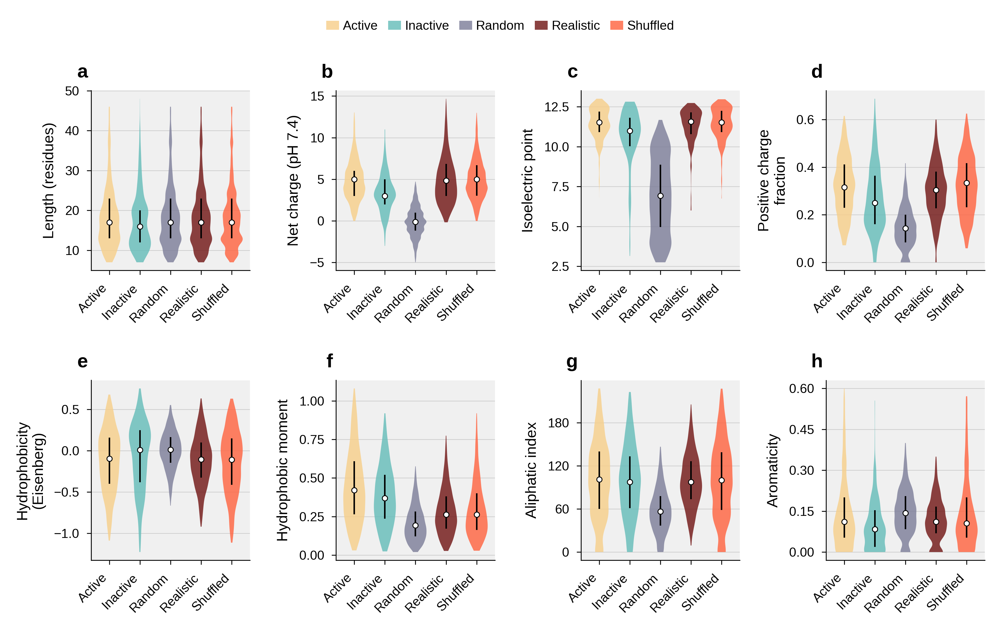

In [11]:
# Supplementary: Synthetic negative properties
from modlamp.descriptors import PeptideDescriptor, GlobalDescriptor

VALID_AA = set("ACDEFGHIKLMNPQRSTVWY")
SYNTH_COLORS = {"Active": ACTIVE_COLOR, "Inactive": INACTIVE_COLOR,
                "Random": RANDOM_COLOR, "Realistic": REALISTIC_COLOR, "Shuffled": SHUFFLED_COLOR}
SYNTH_ORDER = ["Active","Inactive","Random","Realistic","Shuffled"]

def clean_seqs(seqs): return [s.strip() for s in seqs if all(c in VALID_AA for c in s.strip()) and len(s.strip())>=3]
def pos_charge_frac(seqs): return np.array([sum(c in "KRH" for c in s)/len(s) for s in seqs])

def comp_desc(seqs):
    seqs=clean_seqs(seqs)
    g=GlobalDescriptor(seqs);g.calculate_charge(ph=7.4);charge=g.descriptor.flatten()
    g2=GlobalDescriptor(seqs);g2.isoelectric_point();pi=g2.descriptor.flatten()
    g3=GlobalDescriptor(seqs);g3.aliphatic_index();al=g3.descriptor.flatten()
    g4=GlobalDescriptor(seqs);g4.aromaticity();ar=g4.descriptor.flatten()
    p=PeptideDescriptor(seqs,"eisenberg");p.calculate_global();hy=p.descriptor.flatten()
    p2=PeptideDescriptor(seqs,"eisenberg");p2.calculate_moment(window=1000,angle=100);hm=p2.descriptor.flatten()
    return {"length":np.array([len(s) for s in seqs],dtype=float),"charge":charge,"isoelectric_point":pi,
            "positive_charge_fraction":pos_charge_frac(seqs),"hydrophobicity":hy,"hydrophobic_moment":hm,
            "aliphatic_index":al,"aromaticity":ar}

rng=np.random.RandomState(42); NS=3000
adf=pd.read_csv(TASKS_DIR/"broad_activity"/"labels.tsv",sep="\t")
ap=adf.loc[adf["label"]=="AMP","sequence"].tolist(); an=adf.loc[adf["label"]=="non-AMP","sequence"].tolist()
syn={}
for tag in ["random","realistic","shuffled"]:
    sd=pd.read_csv(TASKS_DIR/f"synthetic_{tag}"/"labels.tsv",sep="\t")
    syn[tag.capitalize()]=sd.loc[sd["label"]=="non-AMP","sequence"].tolist()

dsets={"Active":list(rng.choice(ap,min(NS,len(ap)),replace=False)),
       "Inactive":list(rng.choice(an,min(NS,len(an)),replace=False))}
for nm in ["Random","Realistic","Shuffled"]: dsets[nm]=list(rng.choice(syn[nm],NS,replace=False))
props={nm:comp_desc(s) for nm,s in dsets.items()}

fl={"Active":adf.loc[adf["label"]=="AMP","sequence"].str.len().values.astype(float),
    "Inactive":adf.loc[adf["label"]=="non-AMP","sequence"].str.len().values.astype(float)}
for tag in ["Random","Realistic","Shuffled"]:
    sd=pd.read_csv(TASKS_DIR/f"synthetic_{tag.lower()}"/"labels.tsv",sep="\t")
    fl[tag]=sd.loc[sd["label"]=="non-AMP","sequence"].str.len().values.astype(float)

fsp,axsp=plt.subplots(2,4,figsize=(MAX_WIDTH,4),dpi=DPI)
pdefs=[("length","Length (residues)",True),("charge","Net charge (pH 7.4)",False),
    ("isoelectric_point","Isoelectric point",False),("positive_charge_fraction","Positive charge\nfraction",False),
    ("hydrophobicity","Hydrophobicity\n(Eisenberg)",False),("hydrophobic_moment","Hydrophobic moment",False),
    ("aliphatic_index","Aliphatic index",False),("aromaticity","Aromaticity",False)]

for ai,(key,yl,uf) in enumerate(pdefs):
    ax=axsp.flat[ai]; dl=[]; rl=[]
    for ds in SYNTH_ORDER:
        d=fl[ds] if (key=="length" and uf) else props[ds][key]; rl.append(d)
        lo,hi=np.percentile(d,[1,99]); dl.append(d[(d>=lo)&(d<=hi)])
    parts=ax.violinplot(dl,positions=range(len(SYNTH_ORDER)),showmeans=False,showmedians=False,showextrema=False,
        widths=0.72,bw_method="silverman",points=200)
    for body,ds in zip(parts["bodies"],SYNTH_ORDER):
        body.set_facecolor(SYNTH_COLORS[ds]);body.set_edgecolor("none");body.set_alpha(0.82)
    for i,d in enumerate(rl):
        q1,med,q3=np.percentile(d,[25,50,75])
        ax.vlines(i,q1,q3,color="k",lw=0.7); ax.scatter(i,med,color="white",s=6,zorder=3,ec="k",lw=0.4)
    ax.set_ylabel(yl,fontsize=FS_LABEL); ax.set_xticks(range(len(SYNTH_ORDER)))
    ax.set_xticklabels(SYNTH_ORDER,rotation=45,ha="right",fontsize=FS_TICK)
    ax.yaxis.set_major_locator(mticker.MaxNLocator(nbins=5))
    style_ax(ax)
    ax.text(-0.02,1.05,string.ascii_lowercase[ai],transform=ax.transAxes,fontsize=9,fontweight="bold",va="bottom",ha="right")

fsp.legend(handles=[mpatches.Patch(fc=SYNTH_COLORS[ds],label=ds,ec="none",alpha=0.82) for ds in SYNTH_ORDER],
    loc="upper center",ncol=5,fontsize=FS_TICK,frameon=False,bbox_to_anchor=(0.5,1.01),
    handlelength=1,handletextpad=0.3,columnspacing=0.8)
plt.tight_layout(rect=[0,0,1,0.95],h_pad=1.8,w_pad=1.2)
save_figure(fsp,"fig_synthetic_properties"); plt.show()

## Supplementary: True vs Predicted MIC scatter plots

One figure per strain (E. coli, S. aureus), each with scatter panels for
all 14 regressors.

INFO: maxp pruned
INFO: cmap pruned
INFO: kern dropped
INFO: post pruned
INFO: FFTM dropped
INFO: GPOS pruned
INFO: GSUB pruned
INFO: glyf pruned
INFO: Added gid0 to subset
INFO: Added first four glyphs to subset
INFO: Closing glyph list over 'MATH': 25 glyphs before
INFO: Glyph names: ['.notdef', '.null', 'A', 'C', 'E', 'G', 'K', 'L', 'M', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'comma', 'i', 'm', 'minus', 'n', 'nonmarkingreturn', 'p', 'plus', 'space']
INFO: Glyph IDs:   [0, 1, 2, 3, 14, 15, 36, 38, 40, 42, 46, 47, 48, 49, 51, 54, 55, 68, 69, 70, 76, 80, 81, 83, 3228]
INFO: Closed glyph list over 'MATH': 25 glyphs after
INFO: Glyph names: ['.notdef', '.null', 'A', 'C', 'E', 'G', 'K', 'L', 'M', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'comma', 'i', 'm', 'minus', 'n', 'nonmarkingreturn', 'p', 'plus', 'space']
INFO: Glyph IDs:   [0, 1, 2, 3, 14, 15, 36, 38, 40, 42, 46, 47, 48, 49, 51, 54, 55, 68, 69, 70, 76, 80, 81, 83, 3228]
INFO: Closing glyph list over 'GSUB': 25 glyphs before
INFO: Glyph names:

Saved /home/pszymczak/code/battleamp-snakemake/figures/figure_supp_mic_ecoli.pdf
Saved /home/pszymczak/code/battleamp-snakemake/figures/figure_supp_mic_ecoli.png


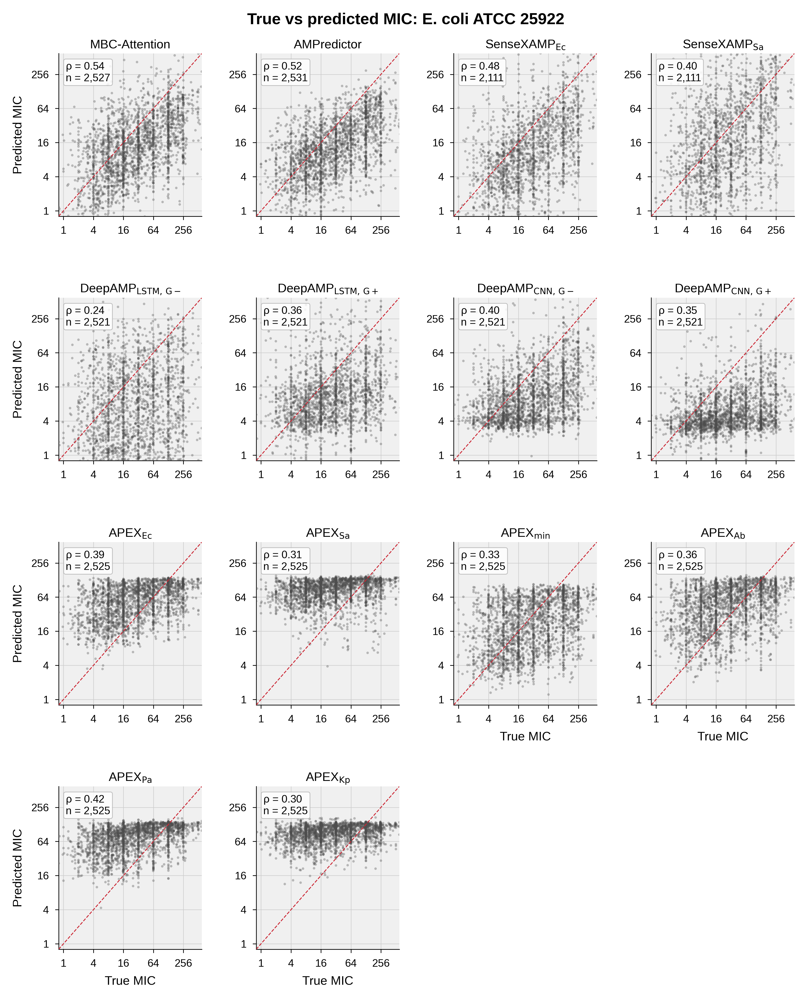

INFO: maxp pruned
INFO: cmap pruned
INFO: kern dropped
INFO: post pruned
INFO: FFTM dropped
INFO: GPOS pruned
INFO: GSUB pruned
INFO: glyf pruned
INFO: Added gid0 to subset
INFO: Added first four glyphs to subset
INFO: Closing glyph list over 'MATH': 25 glyphs before
INFO: Glyph names: ['.notdef', '.null', 'A', 'C', 'E', 'G', 'K', 'L', 'M', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'comma', 'i', 'm', 'minus', 'n', 'nonmarkingreturn', 'p', 'plus', 'space']
INFO: Glyph IDs:   [0, 1, 2, 3, 14, 15, 36, 38, 40, 42, 46, 47, 48, 49, 51, 54, 55, 68, 69, 70, 76, 80, 81, 83, 3228]
INFO: Closed glyph list over 'MATH': 25 glyphs after
INFO: Glyph names: ['.notdef', '.null', 'A', 'C', 'E', 'G', 'K', 'L', 'M', 'N', 'P', 'S', 'T', 'a', 'b', 'c', 'comma', 'i', 'm', 'minus', 'n', 'nonmarkingreturn', 'p', 'plus', 'space']
INFO: Glyph IDs:   [0, 1, 2, 3, 14, 15, 36, 38, 40, 42, 46, 47, 48, 49, 51, 54, 55, 68, 69, 70, 76, 80, 81, 83, 3228]
INFO: Closing glyph list over 'GSUB': 25 glyphs before
INFO: Glyph names:

Saved /home/pszymczak/code/battleamp-snakemake/figures/figure_supp_mic_saureus.pdf
Saved /home/pszymczak/code/battleamp-snakemake/figures/figure_supp_mic_saureus.png


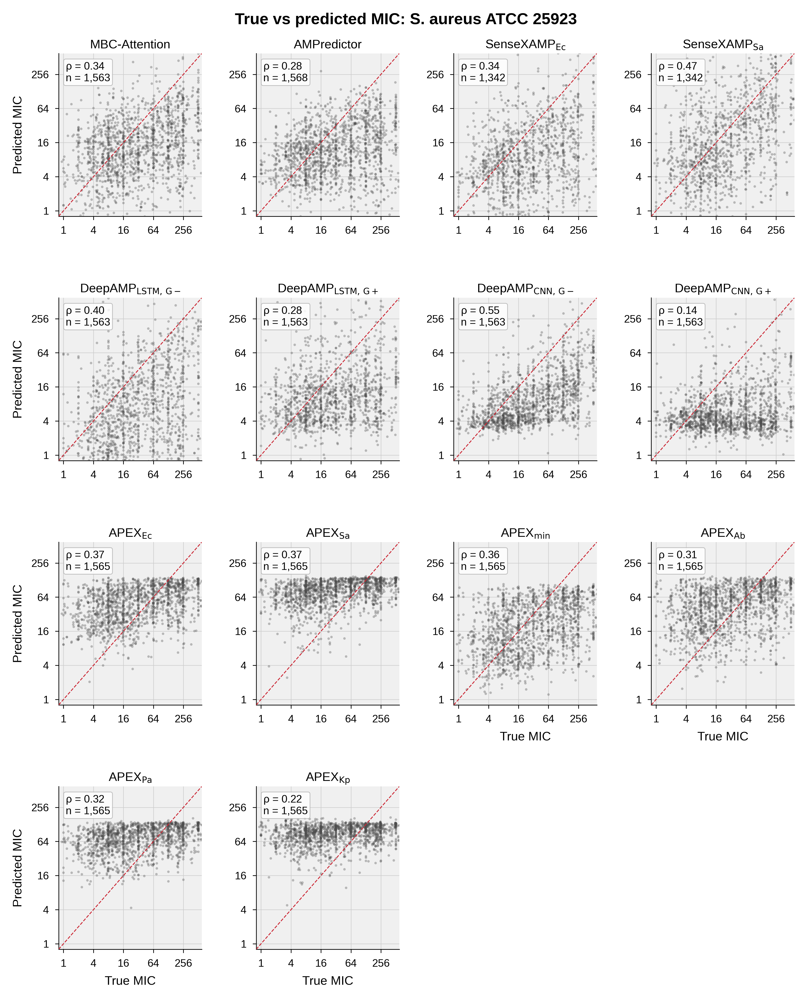

In [12]:
# Supplementary: True vs Predicted MIC scatter plots
import math
from scipy.stats import spearmanr

MIC_CACHE = PROJECT_ROOT / "figure_supp_mic_cache"

STRAIN_TRUTH = OrderedDict([
    ("ecoli", {
        "path": DATA_ROOT / "activity" / "strain" / "escherichiacoliatcc25922_mic.csv",
        "label": "E. coli ATCC 25922", "suffix": "ecoli",
    }),
    ("saureus", {
        "path": DATA_ROOT / "activity" / "strain" / "staphylococcusaureusatcc25923_mic.csv",
        "label": "S. aureus ATCC 25923", "suffix": "saureus",
    }),
])

def _find_mic_col(df, model_id, strain_key):
    for c in ["MIC", "mic"]:
        if c in df.columns: return c
    pats = {"ecoli": ["E. coli","ecoli","e_coli"], "saureus": ["S. aureus","saureus","s_aureus","staph"]}
    for col in df.columns:
        for p in pats.get(strain_key, []):
            if p.lower() in col.lower(): return col
    return None

def load_mic_scatter(model_id, strain_key, truth_path):
    ip = INFERENCE_DIR / model_id / "battleamp-all" / "predictions.tsv"
    if not ip.exists() or not truth_path.exists(): return None
    truth = _normalise_seq_col(pd.read_csv(truth_path)); pred = _normalise_seq_col(pd.read_csv(ip, sep="\t"))
    if "sequence" not in truth.columns or "sequence" not in pred.columns: return None
    tmc = "MIC"
    if tmc not in truth.columns:
        for c in truth.columns:
            if c.lower() == "mic": tmc = c; break
    pmc = _find_mic_col(pred, model_id, strain_key)
    if pmc is None: return None
    ts = truth[["sequence", tmc]].rename(columns={tmc: "true_mic"})
    ts["true_mic"] = pd.to_numeric(ts["true_mic"], errors="coerce")
    ps = pred[["sequence", pmc]].rename(columns={pmc: "pred_mic"})
    ps["pred_mic"] = pd.to_numeric(ps["pred_mic"], errors="coerce")
    mg = ts.merge(ps, on="sequence").dropna()
    mg = mg[(mg["true_mic"] > 0) & (mg["pred_mic"] > 0)]
    return mg[["true_mic", "pred_mic"]] if len(mg) > 0 else None

def compute_mic_cache():
    MIC_CACHE.mkdir(parents=True, exist_ok=True)
    for mid in REG_FIG4:
        for sk, si in STRAIN_TRUTH.items():
            df = load_mic_scatter(mid, sk, si["path"])
            out = MIC_CACHE / f"mic_{mid}_{sk}.tsv"
            if df is not None: df.to_csv(out, sep="\t", index=False)
            else: pd.DataFrame(columns=["true_mic","pred_mic"]).to_csv(out, sep="\t", index=False)
    log.info("MIC scatter cache complete.")

_MIC_CACHE_FILES = [MIC_CACHE / f"mic_{mid}_{sk}.tsv"
                    for mid in REG_FIG4 for sk in STRAIN_TRUTH]
if not all(f.exists() for f in _MIC_CACHE_FILES):
    log.info("MIC scatter cache missing, computing...")
    compute_mic_cache()

for strain_key, strain_info in STRAIN_TRUTH.items():
    n_mod = len(REG_FIG4); n_cols = 4; n_rows = math.ceil(n_mod / n_cols)
    fig_sc, axes_sc = plt.subplots(n_rows, n_cols, figsize=(MAX_WIDTH, MAX_HEIGHT),
                                    dpi=DPI, squeeze=False)
    fig_sc.subplots_adjust(hspace=0.50, wspace=0.38, left=0.08, right=0.97, top=0.93, bottom=0.05)
    fig_sc.suptitle(f"True vs predicted MIC: {strain_info['label']}",
                    fontsize=9, fontweight="bold", y=0.97)

    mids = list(REG_FIG4.keys()); mnames = list(REG_FIG4.values())
    ticks = [1, 4, 16, 64, 256]; lims = [0.8, 600]

    for idx in range(n_rows * n_cols):
        r, c = divmod(idx, n_cols); ax = axes_sc[r, c]
        if idx >= n_mod: ax.set_visible(False); continue
        mid = mids[idx]; ax.set_facecolor(BG)
        ax.grid(True, color=GRID_CLR, lw=0.3, zorder=0); ax.set_axisbelow(True)

        cp = MIC_CACHE / f"mic_{mid}_{strain_key}.tsv"
        has = False
        if cp.exists():
            df = pd.read_csv(cp, sep="\t")
            if len(df) > 0: has = True
        if has:
            tm = df["true_mic"].values; pm = df["pred_mic"].values
            rho, _ = spearmanr(np.log2(tm), np.log2(pm))
            ax.scatter(tm, pm, s=2, alpha=0.35, color="0.30", ec="none", rasterized=True, zorder=3)
            ax.text(0.05, 0.95, f"$\\rho$ = {rho:.2f}\nn = {len(df):,}",
                    transform=ax.transAxes, ha="left", va="top", fontsize=FS_TICK,
                    bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="0.7", alpha=0.85, lw=0.4))
        else:
            ax.text(0.5, 0.5, "NO DATA", transform=ax.transAxes, ha="center", va="center",
                    fontsize=8, color="red", alpha=0.4)

        ax.plot(lims, lims, "--", color="#CC2936", lw=0.5, zorder=5)
        ax.set_xscale("log", base=2); ax.set_yscale("log", base=2)
        ax.set_xlim(lims); ax.set_ylim(lims)
        ax.set_xticks(ticks); ax.set_yticks(ticks)
        ax.set_xticklabels([str(t) for t in ticks]); ax.set_yticklabels([str(t) for t in ticks])
        ax.set_title(mnames[idx], fontsize=FS_TITLE, pad=3)
        if c == 0: ax.set_ylabel("Predicted MIC", fontsize=FS_LABEL)
        if r == n_rows - 1 or idx + n_cols >= n_mod:
            ax.set_xlabel("True MIC", fontsize=FS_LABEL)

    save_figure(fig_sc, f"figure_supp_mic_{strain_info['suffix']}")
    plt.show()